In [1]:
%cd ..

/pub/hofmann-scratch/glanzillo/ded


In [2]:

import importlib
import json
import math
import os
import socket
import sys
import time
from tqdm import tqdm




internal_path = os.path.abspath(os.path.join('.'))
sys.path.append(internal_path)
sys.path.append(internal_path + '/datasets')
sys.path.append(internal_path + '/utils')

import datetime
import uuid
from argparse import ArgumentParser

import setproctitle
import torch
import numpy as np
import pandas as pd 
import json

from copy import deepcopy

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import AutoMinorLocator
from matplotlib.collections import LineCollection



import shutil
from utils.args import add_management_args, add_rehearsal_args
from utils.conf import set_random_seed, get_device, base_path
from utils.status import ProgressBar
from utils.stil_losses import *
from utils.nets import CNN, resnet18, resnet50
from utils.kernels import *
from torchvision.datasets import ImageNet, ImageFolder
from torch.utils.data import ConcatDataset
from utils.eval import evaluate, validation_and_agreement, distance_models, validation_agreement_function_distance
from dataset_utils.data_utils import load_dataset, CIFAR100sparse2coarse



## Tanget kernel calculation

In [3]:
def center_kernel(K):
    # n = K.shape[0]
    # H = torch.eye(n) - torch.ones((n,n))/n 
    # return torch.matmul(K,H.to(K.device))

    return K - K.mean(dim=1).view(-1,1)


In [4]:
def plot_matrix(M, title, size=(8,10)):
    fig, ax = plt.subplots(figsize=size)
    mat = ax.matshow(M)
    ax.set_title(title,fontsize=20)
    ax.tick_params(axis='x', colors='black', top=False, labelbottom=True, labeltop=False)
    ax.tick_params(axis='y', colors='black', bottom=True, top=False)

    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.05, 0.7])
    fig.colorbar(mat, cax=cbar_ax, fraction=0.046, pad=0.04)

    plt.show()
    return fig

In [5]:
GPUID = 2
#os.environ["CUDA_VISIBLE_DEVICES"]=str(GPUID)
device = get_device([GPUID])

In [6]:
def kernel_basis_alignment(K, L):
    """
       K, L kernel matrices of the same size"""
    D1, Q1 = torch.linalg.eigh(K)
    D2, Q2 = torch.linalg.eigh(L)

    return Q1.T@Q2
    

In [7]:
def project_K_subspace(v, M, k):
    """
       v: matrix of vectors to project (NxD), 
       M: space to project to (assumed symmetric) (NxN)
       k: subspace size"""
    D, Q = torch.linalg.eigh(M)
    v_proj = (Q[:,-k:] @ torch.diag(D[-k:]).to(M.device) @ Q[:,-k:].T) @ v
    return v_proj
    

In [8]:
def project_to_vec(v, u, lamda):
    """
       v: matrix of vectors to project (NxD), 
       u: vector to project to (N*1)
       lamda: multiplicative factor (eigenvalue)"""
    
    v_proj = lamda * torch.matmul(v.T,u)
    return v_proj
    

In [9]:
from torch.func import functional_call, vmap, vjp, jvp, jacrev

In [71]:
# resources: pytorch tutorial https://pytorch.org/tutorials/intermediate/neural_tangent_kernels.html 
def get_params(net):
    params = {k: v.detach() for k, v in net.named_parameters()}
    return params

def get_fnet_func(net):
    def fnet_single(params, x):
        return functional_call(net, params, (x.unsqueeze(0),)).squeeze(0)
    return fnet_single

def empirical_ntk_jacobian_contraction(fnet_single, params, x1, x2, compute='full'):
    # Compute J(x1)
    jac1 = vmap(jacrev(fnet_single), (None, 0))(params, x1)
    jac1 = jac1.values()
    jac1 = [j.flatten(2) for j in jac1]

    # Compute J(x2)
    jac2 = vmap(jacrev(fnet_single), (None, 0))(params, x2)
    jac2 = jac2.values()
    jac2 = [j.flatten(2) for j in jac2]

    # Compute J(x1) @ J(x2).T
    einsum_expr = None
    if compute == 'full':
        einsum_expr = 'Naf,Mbf->NMab'
    elif compute == 'trace':
        einsum_expr = 'Naf,Maf->NM'
    elif compute == 'diagonal':
        einsum_expr = 'Naf,Maf->NMa'
    else:
        assert False

    result = torch.stack([torch.einsum(einsum_expr, j1, j2) for j1, j2 in zip(jac1, jac2)])
    result = result.sum(0)
    return result

def empirical_ntk_ntk_vps(func, params, x1, x2, compute='full'):
    def get_ntk(x1, x2):
        def func_x1(params):
            return func(params, x1)

        def func_x2(params):
            return func(params, x2)

        output, vjp_fn = vjp(func_x1, params)

        def get_ntk_slice(vec):
            # This computes ``vec @ J(x2).T``
            # `vec` is some unit vector (a single slice of the Identity matrix)
            vjps = vjp_fn(vec)
            # This computes ``J(X1) @ vjps``
            _, jvps = jvp(func_x2, (params,), vjps)
            return jvps

        # Here's our identity matrix
        basis = torch.eye(output.numel(), dtype=output.dtype, device=output.device).view(output.numel(), -1)
        return vmap(get_ntk_slice)(basis)

    # ``get_ntk(x1, x2)`` computes the NTK for a single data point x1, x2
    # Since the x1, x2 inputs to ``empirical_ntk_ntk_vps`` are batched,
    # we actually wish to compute the NTK between every pair of data points
    # between {x1} and {x2}. That's what the ``vmaps`` here do.
    result = vmap(vmap(get_ntk, (None, 0)), (0, None))(x1, x2)

    if compute == 'full':
        return result
    if compute == 'trace':
        return torch.einsum('NMKK->NM', result)
    if compute == 'diagonal':
        return torch.einsum('NMKK->NMK', result)

def get_ntk(data_loader, device, model, num_batches=100, silent=False, mode="full"):
    # running estimate of the outer products and mean
    total=0
    if not silent: progress_bar = ProgressBar(verbose=True)

    X = [] # we collect all the gradients in a matrix NxO

    for i, data in enumerate(data_loader):
        if i==num_batches: break 
        inputs, _ = data
        inputs = inputs.to(device)
        B = inputs.size(0)
        X.append(inputs)
        total+=B
                
        if not silent: 
            progress_bar.prog(i, len(data_loader), -1, 'Collecting inputs', i/(min(len(data_loader),num_batches)))  
    
    X = torch.vstack(X).view((total,)+inputs.shape[1:]).to(device)
    ntk = empirical_ntk_jacobian_contraction(get_fnet_func(model), get_params(model), X, X, compute=mode)
    #ntk = empirical_ntk_ntk_vps(get_fnet_func(model), get_params(model), X, X)
    return ntk

def get_ntk_reverse(data_loader, device, model, num_batches=100, silent=False):
    # running estimate of the outer products and mean
    total=0
    if not silent: progress_bar = ProgressBar(verbose=True)

    X = [] # we collect all the gradients in a matrix NxO

    for i, data in enumerate(data_loader):
        if i==num_batches: break 
        inputs, _ = data
        inputs = inputs.to(device)
        B = inputs.size(0)
        X.append(inputs)
        total+=B
                
    
    X = torch.vstack(X).view((total,)+inputs.shape[1:]).to(device)

    NTK_matrix = torch.zeros((total,total), device=device)
    for i in range(total):
        for j in range(total):
            NTK_matrix[i,j] = empirical_ntk_jacobian_contraction(get_fnet_func(model), get_params(model), X[i].unsqueeze(0), X[j].unsqueeze(0), compute="trace")
            
            if not silent: 
                progress_bar.prog(i, total, -1, 'Computing ntk', i/total)  

    return NTK_matrix



### CIFAR 5M

In [11]:
NUM_SAMPLES = 500000

In [12]:

C5m_train, C5m_test = load_dataset('cifar5m', augment=False)

print(f"Randomly drawing {NUM_SAMPLES} samples for the Cifar5M base")
all_indices = set(range(len(C5m_train)))
random_indices = np.random.choice(list(all_indices), size=NUM_SAMPLES, replace=False)
data = Subset(C5m_train, random_indices)
# IMPORTANT: NO SHUFFLING TO PRESERVE THE ORDERING
loader = DataLoader(data, batch_size=128, shuffle=False, num_workers=4, pin_memory=False)
valloader = DataLoader(C5m_test, batch_size=128, shuffle=False, num_workers=4, pin_memory=False)

Loading CIFAR 5mil...
Loaded part 1/6
Loaded part 2/6
Loaded part 3/6
Loaded part 4/6
Loaded part 5/6
Loaded part 6/6
Randomly drawing 500000 samples for the Cifar5M base


In [11]:
C10_train, C10_val = load_dataset('cifar10', augment=False)
shuffled_train = torch.utils.data.Subset(C10_train, torch.randperm(len(C10_train)).tolist())
loader = DataLoader(shuffled_train, batch_size=128, shuffle=False, num_workers=4, pin_memory=False)
valloader = DataLoader(C10_val, batch_size=128, shuffle=False, num_workers=4, pin_memory=False)

In [12]:
def load_checkpoint(best=False, filename='checkpoint.pth.tar', type='mnet'):
    """ Available network types: [mnet, convnet]"""
    path = base_path() + "chkpts" + "/" + "cifar5m" + "/" + f"{type}/"
    if best: filepath = path + 'model_best.ckpt'
    else: filepath = path + filename
    if os.path.exists(filepath):
          print(f"Loading existing checkpoint {filepath}")
          checkpoint = torch.load(filepath, map_location=device)
          return checkpoint
    return None 

In [13]:
type = "CNN"
base_net = CNN(c=20, num_classes=10, use_batch_norm=True) 

In [14]:
CHKPT_NAME = f'{type}-teacher.ckpt' 

In [15]:
teacher = deepcopy(base_net)
checkpoint = load_checkpoint(best=False, filename=CHKPT_NAME, type=type) 
if checkpoint: 
        teacher.load_state_dict(checkpoint['state_dict'])
        teacher.to(device)
teacher.eval();

Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-teacher.ckpt


In [50]:
#teacher_ntk = get_ntk(loader, device, teacher, num_batches=10, silent=False)
#N,N,O,O = teacher_ntk.shape
tNTK = get_ntk(valloader, device, teacher, num_batches=5, silent=True, mode="trace")

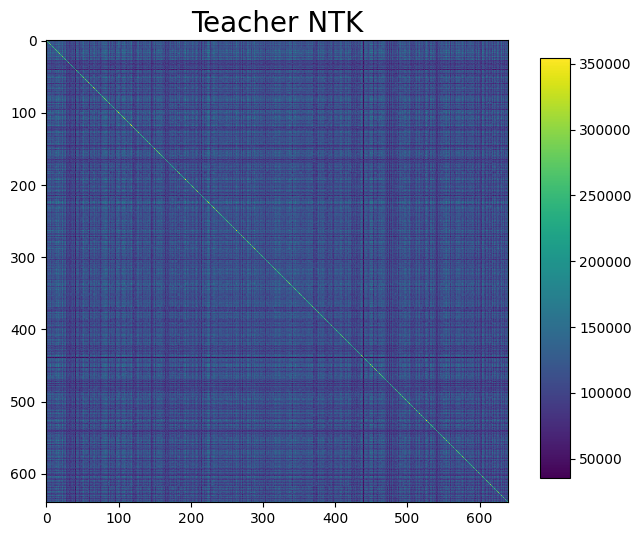

In [47]:
plot_matrix(tNTK.cpu(), r'Teacher NTK', size=(6,6));

In [22]:
seed = 11; buffer_size = 24000

In [32]:
alpha = 0.0

student = deepcopy(base_net)
STUDNT_NAME = f'{type}-student-{seed}-{buffer_size}-{alpha}.ckpt'
print(STUDNT_NAME)
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, type=type) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

CNN-student-11-24000-0.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-11-24000-0.0.ckpt


[ 01-04 | 10:47 ] Task Collecting inputs | epoch -1: |███┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 6631.43 ep/h | loss: 0.8 |

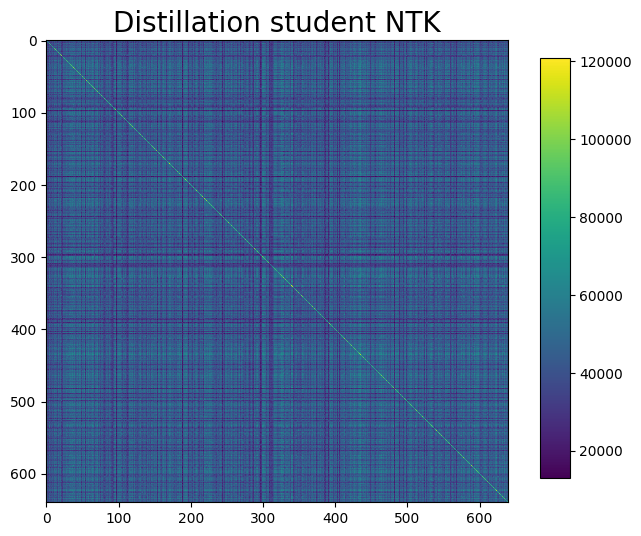

In [33]:
s0NTK = get_ntk(valloader, device, student, num_batches=5, silent=False, mode="trace")
s0NTK.shape; plot_matrix(s0NTK.cpu(), r'Distillation student NTK', size=(6,6));

In [34]:
alpha = 1.0

student = deepcopy(base_net)
STUDNT_NAME = f'{type}-student-{seed}-{buffer_size}-{alpha}.ckpt'
print(STUDNT_NAME)
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, type=type) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

CNN-student-11-24000-1.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-11-24000-1.0.ckpt


[ 01-04 | 10:47 ] Task Collecting inputs | epoch -1: |███┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 7938.15 ep/h | loss: 0.8 ||

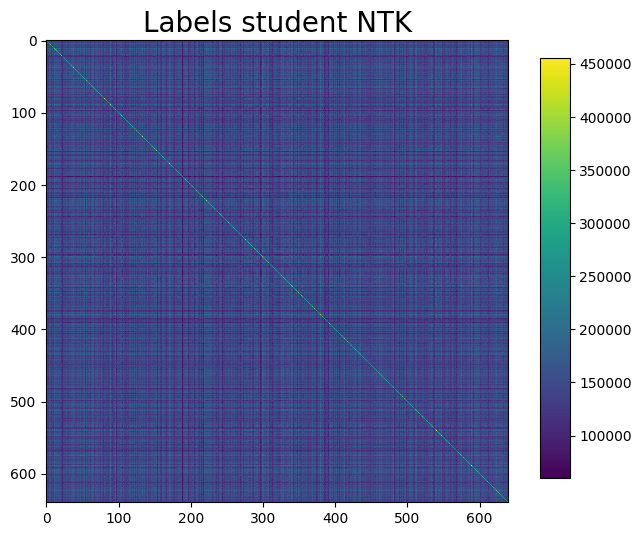

In [35]:
s1NTK = get_ntk(valloader, device, student, num_batches=5, silent=False, mode="trace")
s1NTK.shape; plot_matrix(s1NTK.cpu(), r'Labels student NTK', size=(6,6));

Checking kernel alignment

In [36]:
centered_kernal_alignment(s0NTK,tNTK).item()

0.9312570095062256

In [37]:
centered_kernal_alignment(s1NTK,tNTK).item()

0.929215133190155

In [48]:
spectrum_T = np.linalg.eigvals(tNTK)

In [49]:
spectrum_S0 = np.linalg.eigvals(s0NTK)

In [50]:
spectrum_S1 = np.linalg.eigvals(s1NTK)

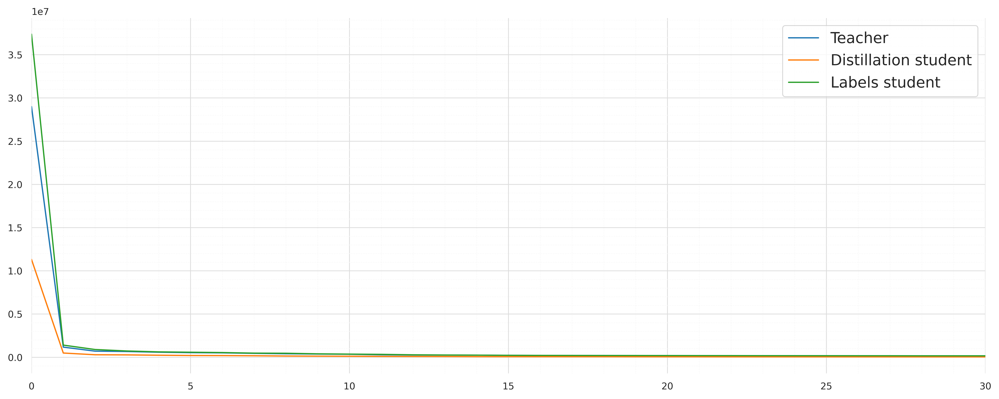

In [51]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(16,6), sharey=True, dpi=600)
    i = range(len(spectrum_T))
    plt.plot(np.flip(np.sort(spectrum_T)), '-', label='Teacher', ms=0.5)

    plt.plot(np.flip(np.sort(spectrum_S0)), '-', label='Distillation student')
    plt.plot(np.flip(np.sort(spectrum_S1)), '-', label='Labels student')

    #ax.set_yscale('symlog',linthresh=10e-2)
    #x.set_xscale('symlog',linthresh=10e-2)
    
    #ax.set_ylim([0.0,1.0])

    ax.set_xlim([0,30])

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=14)


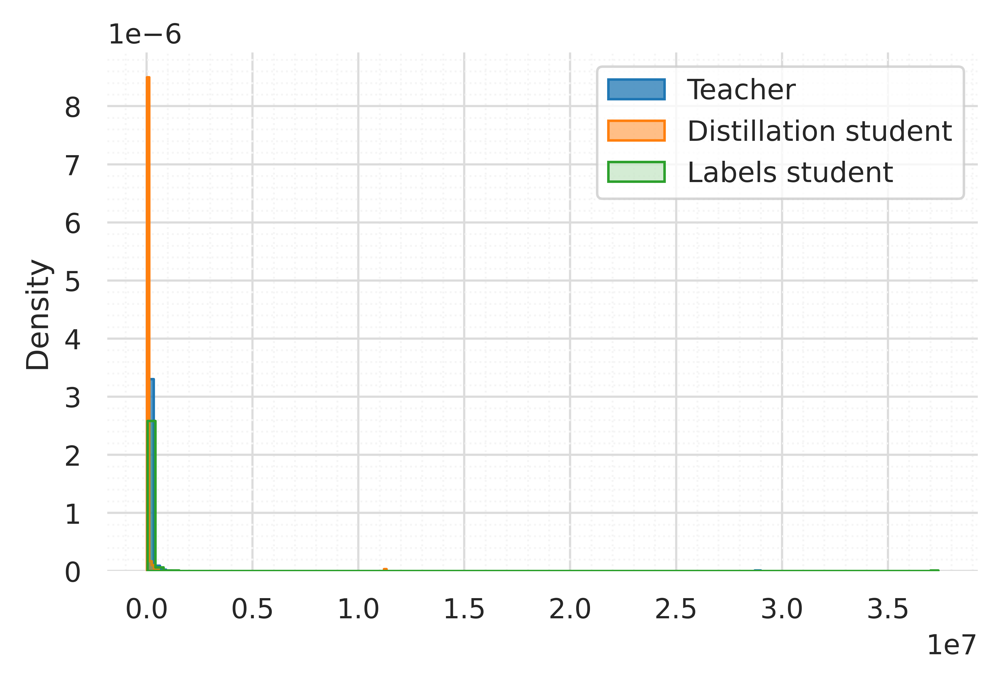

In [53]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,3), sharey=True, dpi=800)

    x = range(len(spectrum_T))
    sns.histplot(spectrum_T, label='Teacher',   bins=100, ax=ax,  fill=True, element="step", stat="density")
    sns.histplot(spectrum_S0, label='Distillation student',  alpha=0.5, bins=100, ax=ax,  fill=True, element="step",
    stat="density")
    sns.histplot(spectrum_S1, label='Labels student',  alpha=0.2, bins=100, ax=ax,  fill=True, element="step",
    stat="density")

    #ax.set_yscale('symlog',linthresh=10e-3)
    #ax.set_xscale('symlog',linthresh=10e4)
    
    #ax.set_ylim([0.0,1.0])

    #ax.set_xlim([600,800])

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=9)


loading different seeds and computing kernel alignment

In [38]:
buffer_size = 24000

In [44]:
results = pd.DataFrame()
columns = ['seed','alpha','cka_teacher']

In [45]:
SEEDS = [11, 13, 21, 33, 55]

In [51]:
total = 0
for seed in SEEDS:
        for alpha in [0.0,1.0]:
                student = deepcopy(base_net)
                STUDNT_NAME = f'{type}-student-{seed}-{buffer_size}-{alpha}.ckpt'
                checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, type=type) 
                if checkpoint: 
                        student.load_state_dict(checkpoint['state_dict'])
                        student.to(device)
                        student.eval()
                        sNTK = get_ntk(valloader, device, student, num_batches=5, silent=True, mode="trace")
                        cka = centered_kernal_alignment(sNTK,tNTK)
                        sub_df = pd.DataFrame({"seed":[seed], 
                                               "alpha": [alpha], 
                                               "cka_teacher": [cka.item()]})
                        results = pd.concat([results, sub_df], ignore_index=True)
                        total+=1
results

Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-11-24000-0.0.ckpt


Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-11-24000-1.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-13-24000-0.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-13-24000-1.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-21-24000-0.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-21-24000-1.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-33-24000-0.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-33-24000-1.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-55-24000-0.0.ckpt
Loading existing checkpoint ./logs/chkpts/cifar5m/CNN/CNN-student-55-24000-1.0.ckpt


,seed,alpha,cka_teacher
0,11,0.0,0.929699
1,11,1.0,0.926398
2,13,0.0,0.933908
3,13,1.0,0.920585
4,21,0.0,0.924519
5,21,1.0,0.927805
6,33,0.0,0.933439
7,33,1.0,0.919292
8,55,0.0,0.935956
9,55,1.0,0.922458


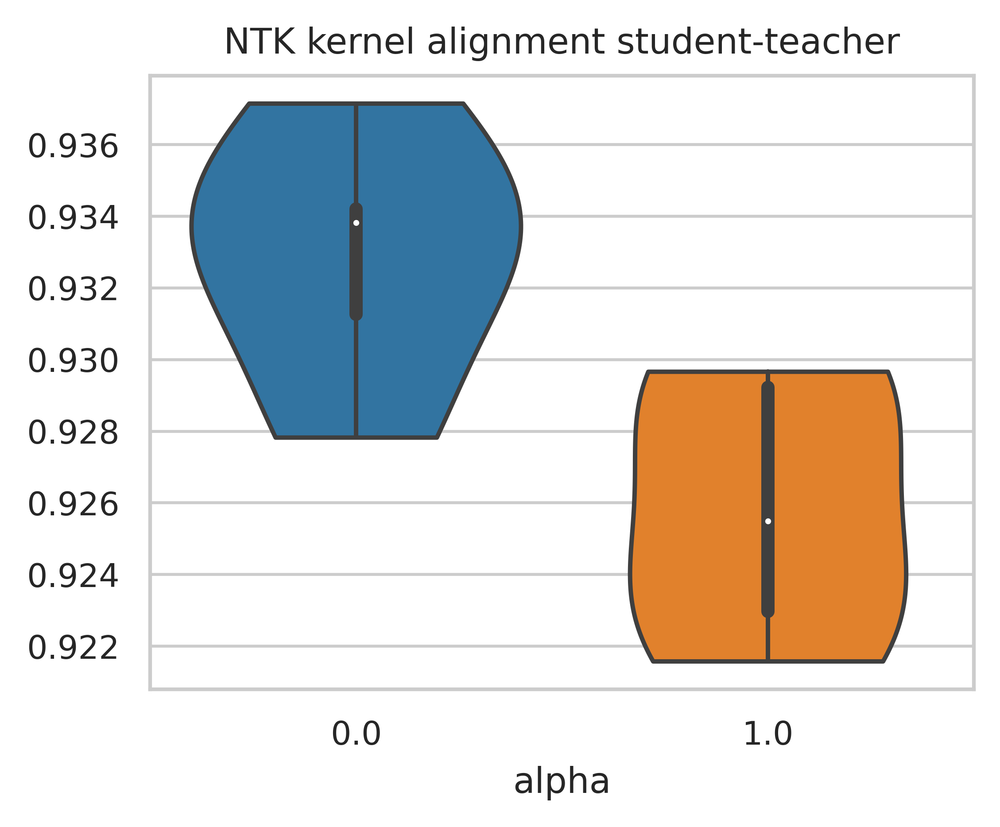

In [53]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(4,3), sharey=True, dpi=600)
    sns.violinplot(data=results[10:], x="alpha", y="cka_teacher", cut=0, ax=ax)
    ax.set_ylabel("")
    ax.set_title("NTK kernel alignment student-teacher")
#sns.despine(offset=10, trim=True)

### CIFAR 100

In [61]:
C100_train, C100_val = load_dataset('cifar100', augment=False)
all_data = ConcatDataset([C100_train, C100_val])
shuffled_train = torch.utils.data.Subset(C100_train, torch.randperm(len(C100_train)).tolist())
loader = DataLoader(shuffled_train, batch_size=1, shuffle=False, num_workers=4, pin_memory=False)
valloader = DataLoader(C100_val, batch_size=1, shuffle=False, num_workers=4, pin_memory=False)

In [55]:
def load_checkpoint(best=False, filename='checkpoint.pth.tar', device=None, type="resnet18"):
    path = base_path() + "chkpts" + "/" + "cifar100" + "/" + f"{type}/"
    if best: filepath = path + 'model_best.ckpt'
    else: filepath = path + filename
    if os.path.exists(filepath):
          print(f"Loading existing checkpoint {filepath}")
          checkpoint = torch.load(filepath, map_location=device)
          return checkpoint
    return None 

Loading the teacher and computing the kernel

In [69]:
# initialising the model
base_net = resnet18(100)
type="resnet18"

CHKPT_NAME = f'{type}-teacher.ckpt'
teacher = deepcopy(base_net)
checkpoint = load_checkpoint(best=False, filename=CHKPT_NAME, device=device, type=type) 
if checkpoint: 
        teacher.load_state_dict(checkpoint['state_dict'])
        teacher = teacher.to(device)
teacher.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-teacher.ckpt


In [72]:
tNTK = get_ntk_reverse(loader, device, teacher, num_batches=100, silent=False)
N,N = tNTK.shape

[ 01-04 | 11:00 ] Task Computing ntk | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 4.29 ep/h | loss: 0.11 |||

KeyboardInterrupt: 

In [73]:
tNTK = get_ntk(loader, device, teacher, num_batches=10, silent=False, mode="trace")


[ 01-04 | 11:00 ] Task Collecting inputs | epoch -1: |┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 58.89 ep/h | loss: 0.9 |

OutOfMemoryError: CUDA out of memory. Tried to allocate 8.79 GiB (GPU 2; 23.68 GiB total capacity; 13.46 GiB already allocated; 1.42 GiB free; 21.01 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

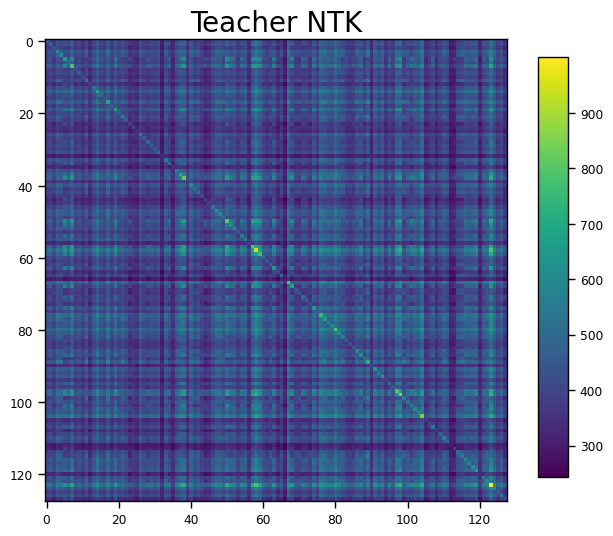

In [66]:
plot_matrix(tNTK, r'Teacher NTK', size=(6,6));

In [278]:
alpha = 0.0
temperature = 20.
STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


In [279]:
KS0 = compute_empirical_kernel(loader, student, device=device, num_batches=NUM_BATCHES, center=True)

[ 12-22 | 11:52 ] Task Collecting features | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 372.53 ep/h | loss: 0.93333333 |

In [280]:
alpha = 1.0
temperature = 1.
STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


In [281]:
KS1 = compute_empirical_kernel(loader, student, device=device, num_batches=NUM_BATCHES, center=True)

[ 12-22 | 11:52 ] Task Collecting features | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 390.81 ep/h | loss: 0.93333333 |

In [263]:
centered_kernal_alignment(KS0,KT)

tensor(0.8126, device='cuda:3')

In [32]:
centered_kernal_alignment(KS1,KT)

tensor(0.7702)

In [33]:
spectrum_T = np.linalg.eigvals(KT)

In [35]:
spectrum_S0 = np.linalg.eigvals(KS0)

In [36]:
spectrum_S1 = np.linalg.eigvals(KS1)

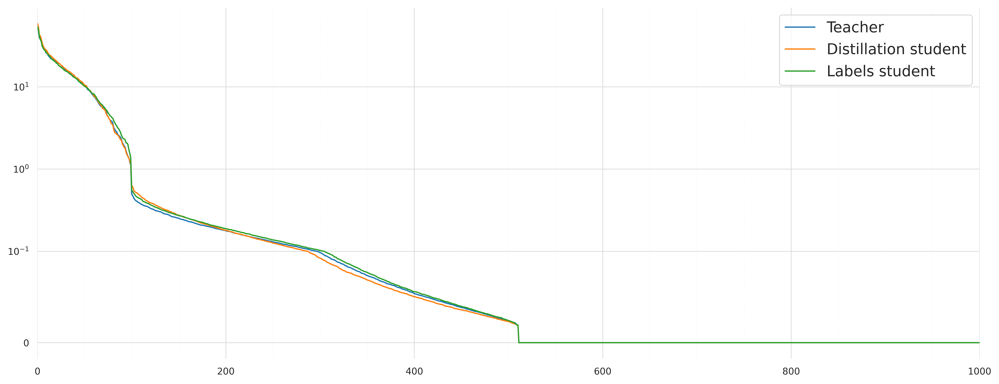

In [37]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(16,6), sharey=True, dpi=600)
    i = range(len(spectrum_T))
    plt.plot(np.flip(np.sort(spectrum_T)), '-', label='Teacher', ms=0.5)
    plt.plot(np.flip(np.sort(spectrum_S0)), '-', label='Distillation student')
    plt.plot(np.flip(np.sort(spectrum_S1)), '-', label='Labels student')

    ax.set_yscale('symlog',linthresh=10e-2)
    #x.set_xscale('symlog',linthresh=10e-2)
    
    #ax.set_ylim([0.0,1.0])

    ax.set_xlim([0,1000])

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=14)


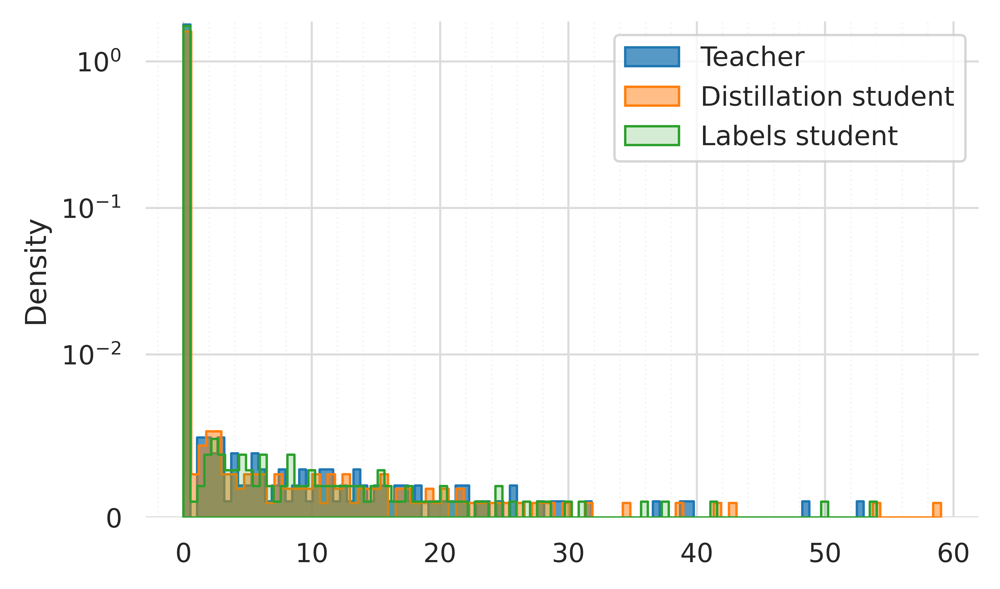

In [38]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,3), sharey=True, dpi=800)

    x = range(len(spectrum_T))
    sns.histplot(spectrum_T, label='Teacher',   bins=100, ax=ax,  fill=True, element="step", stat="density")
    sns.histplot(spectrum_S0, label='Distillation student',  alpha=0.5, bins=100, ax=ax,  fill=True, element="step",
    stat="density")
    sns.histplot(spectrum_S1, label='Labels student',  alpha=0.2, bins=100, ax=ax,  fill=True, element="step",
    stat="density")

    ax.set_yscale('symlog',linthresh=10e-3)
    #ax.set_xscale('symlog',linthresh=10e1)
    
    #ax.set_ylim([0.0,1.0])

    #ax.set_xlim([600,800])

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=9)


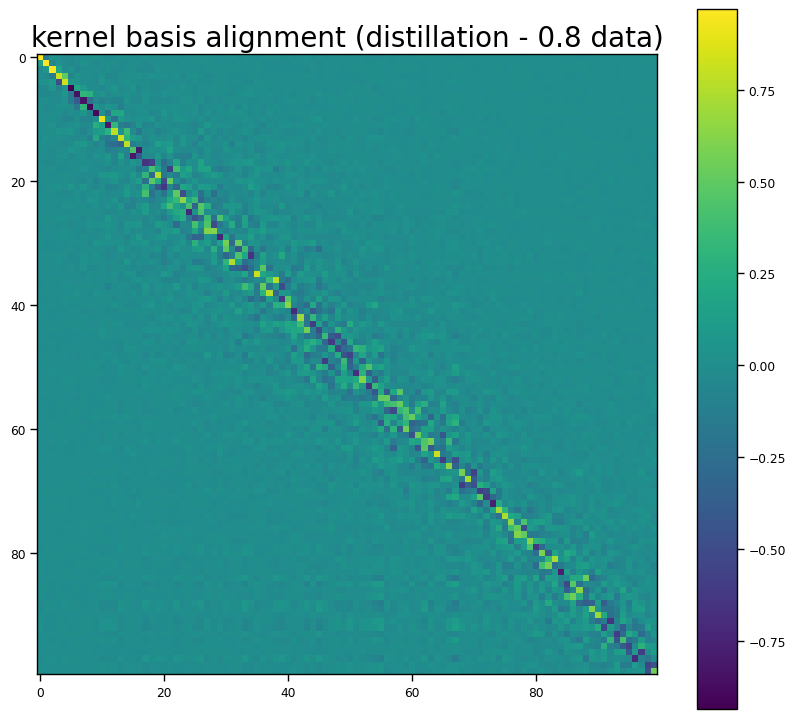

In [282]:
M = kernel_basis_alignment(KS0, KT).cpu()
M = np.flip(M.numpy())
plot_matrix(M[:100,:100],title="kernel basis alignment (distillation - 0.8 data)"); 

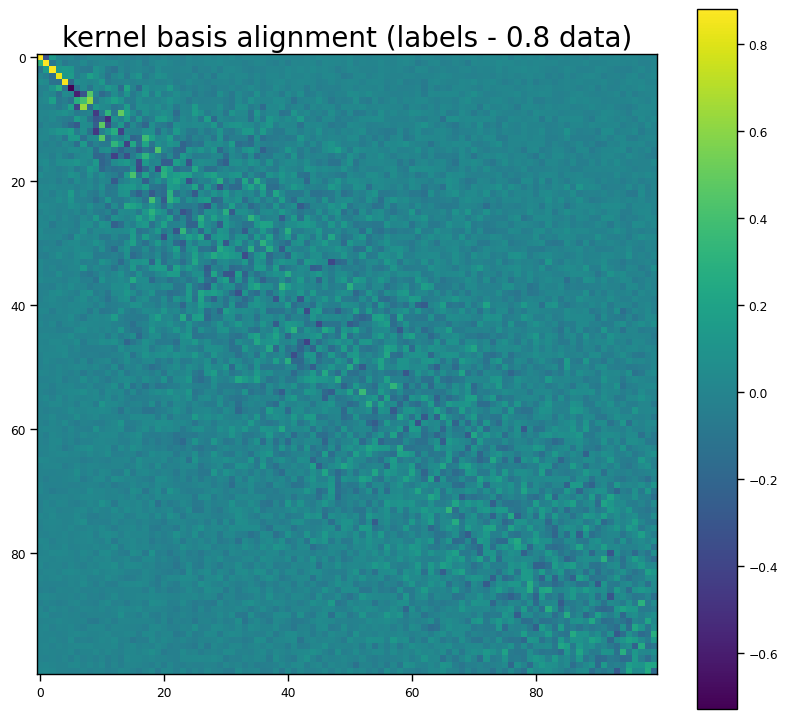

In [283]:
M = kernel_basis_alignment(KS1, KT).cpu()
M = np.flip(M.numpy())
plot_matrix(M[:100,:100],title="kernel basis alignment (labels - 0.8 data)"); 

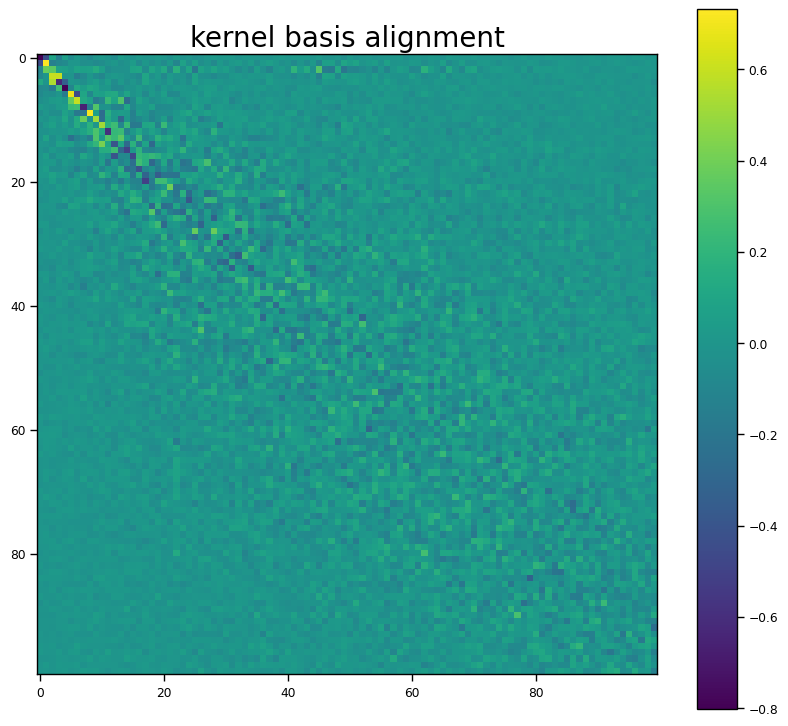

In [151]:
M = kernel_basis_alignment(KS0, KS1)
M = np.flip(M.numpy())
plot_matrix(M[:100,:100],title="kernel basis alignment");

#### Kernel regression on the targets

In [42]:
def do_kernel_regression(train_Phi, test_Phi, Y, lamda):
    """Computes kernel (ridge) regrssion predictions on test data
    - train_Phi: NxD feature matrix
    - test_Phi: LxD featue matrix
    - Y: NxC labels matrix"""
    N = train_Phi.shape[0]
    M = train_Phi@train_Phi.T + lamda*torch.eye(N).to(train_Phi.device)
    k = test_Phi@train_Phi.T 
    predictions = k@torch.linalg.inv(M)@Y
    return predictions

In [43]:
student = resnet18(num_classes=100)
buffer_size = 48000
seed = 11

In [47]:
distillation=False
alpha = 0.0 if distillation else 1.0
temperature = 20. if distillation else 1.0

STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval()
model = student

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


In [48]:
lamda = 1.0 # ridge hyperparameter
train_batches = 20; test_batches = 10 # samples = batches x 128 
centering = False

train_features = get_features(loader, model, device, num_batches=train_batches, center=centering)
test_features = get_features(valloader, model, device, num_batches=test_batches, center=centering)
train_targets = get_targets(loader, device, num_batches=train_batches, model=None, C=100)
test_targets = get_targets(valloader, device, num_batches=test_batches, model=None, C=100)
test_y_targets = get_targets(valloader, device, num_batches=test_batches, model=None, C=100)

test_predictions = do_kernel_regression(train_features, test_features, train_targets, lamda)

[ 12-22 | 10:37 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5258.85 ep/h | loss: 0.9 ||

In [49]:
class_predictions = torch.max(test_predictions, dim=1)[1]
class_targets = torch.max(test_targets, dim=1)[1]
class_y_targets = torch.max(test_y_targets, dim=1)[1]
(class_targets == class_predictions).float().mean(), (class_y_targets == class_predictions).float().mean()

(tensor(0.7250, device='cuda:3'), tensor(0.7250, device='cuda:3'))

In [ ]:
# accuracy distillation/0.8/20: 0.7883 - 0.70 
# accuracy labels/0.8/20: 0.662

teacher predictions

In [50]:
model = resnet18(num_classes=100) # randomly initialised net
model = model.to(device)
model.eval();

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2_x): Sequential(
    (0): BasicBlock(
      (residual_function): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (residual_function): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_

In [337]:
model = teacher

In [338]:
lamda = 1.0 # ridge hyperparameter
test_batches = 20 # samples = batches x 128 
centering = False

N = []
Ts = []
lamdas = [0, 10e-4, 10e-3, 10e-2, 10e-1, 10e0]
for lamda in lamdas:
    t = []
    for train_batches in tqdm(range(20, 200, 20)):

        train_features = get_features(loader, model, device, num_batches=train_batches, center=centering, silent=True)
        N.append(train_features.shape[0])
        test_features = get_features(valloader, model, device, num_batches=test_batches, center=centering, silent=True)
        train_targets = get_targets(loader, device, num_batches=train_batches, model=None, C=100, silent=True)
        test_y_targets = get_targets(valloader, device, num_batches=test_batches, model=None, C=100, silent=True)

        test_predictions = do_kernel_regression(train_features, test_features, train_targets, lamda)
        class_predictions = torch.max(test_predictions, dim=1)[1]
        class_y_targets = torch.max(test_y_targets, dim=1)[1]
        accuracy = (class_y_targets == class_predictions).float().mean()
        t.append(accuracy.item())
    Ts.append(t)

100%|██████████| 9/9 [01:06<00:00,  7.41s/it]


In [52]:
N[:10]

[2560, 5120, 7680, 10240, 12800, 15360, 17920, 20480, 23040, 2560]

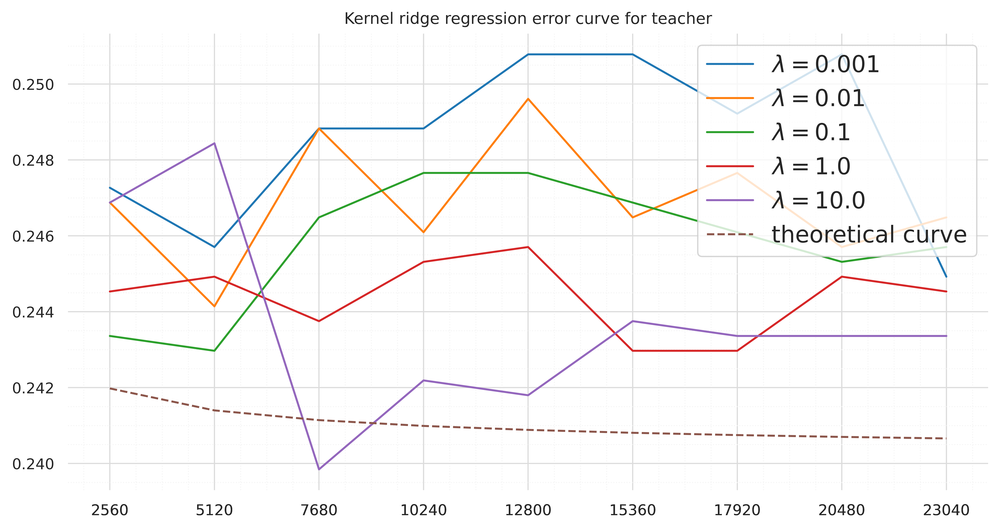

In [345]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(10,5), sharey=True, dpi=800)

    for i,lamda in enumerate(lamdas):
        if lamda>0:
            t = Ts[i]
            sns.lineplot(x=N[:9], y=[1-a for a in t], 
                        label=r"$\lambda = {}$".format(lamda))
        else: continue
    
    # hypothetical curve 
    t = [0.1/np.sqrt(x)+ 0.24 for x in N[:9]]
    sns.lineplot(x=N[:9], y=t, ls="--",
                        label="theoretical curve")
    
    #ax.set_xlim([0,1000])
    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(N)
    ax.set_xticklabels(N, fontsize=9)



    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=14)
    ax.set_title("Kernel ridge regression error curve for teacher")


Doing kernel regression across data sizes and temperatures

In [56]:
kr_results = pd.DataFrame(columns=['alpha','data','seed','temperature'])

BUFFER_SIZES = [1200, 6000, 12000, 24000, 48000]
TEMPERATURES = [0.1, 1.0, 3.0, 20.0]

In [62]:

index = 0 

lamda = 1.0 # ridge hyperparameter
train_batches = 20; test_batches = 10 # samples = batches x 128 
centering = False

total_num = len(BUFFER_SIZES)*len(TEMPERATURES)*2

start = time.time()

for distillation in [False, True]:
    alpha= 0.0 if distillation else 1.0
    for buffer_size in BUFFER_SIZES:
        for temperature in TEMPERATURES:

            STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
            checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
            
            if checkpoint: 
                    student.load_state_dict(checkpoint['state_dict'])
                    student.to(device)
                    student.eval()
                    
                    model=student

                    train_features = get_features(loader, model, device, num_batches=train_batches, center=centering)
                    test_features = get_features(valloader, model, device, num_batches=test_batches, center=centering)
                    train_targets = get_targets(loader, device, num_batches=train_batches, model=None, C=100)
                    test_y_targets = get_targets(valloader, device, num_batches=test_batches, model=None, C=100)

                    test_predictions = do_kernel_regression(train_features, test_features, train_targets, lamda)
                    class_predictions = torch.max(test_predictions, dim=1)[1]
                    class_y_targets = torch.max(test_y_targets, dim=1)[1]
                    test_accuracy = (class_y_targets == class_predictions).float().mean()
                        
                    kr_results.loc[index,['alpha','data','seed','temperature']] = [alpha, buffer_size, seed, temperature]
                    kr_results.loc[index, 'test_accuracy'] = test_accuracy.item()
                    index+=1

            check_time = time.time() 
            print(f"Iteration {index} - {check_time - start} s passed")

kr_results

Iteration 0 - 0.004629611968994141 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-1.0-1.0.ckpt


[ 12-22 | 10:49 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5701.13 ep/h | loss: 0.9 ||

Iteration 1 - 2.6247470378875732 s passed
Iteration 1 - 2.626146078109741 s passed
Iteration 1 - 2.6261770725250244 s passed
Iteration 1 - 2.6261963844299316 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-1.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5621.17 ep/h | loss: 0.9 ||

Iteration 2 - 5.2659618854522705 s passed
Iteration 2 - 5.267322540283203 s passed
Iteration 2 - 5.267363786697388 s passed
Iteration 2 - 5.267610311508179 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-1.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5819.63 ep/h | loss: 0.9 ||

Iteration 3 - 7.882129907608032 s passed
Iteration 3 - 7.883386135101318 s passed
Iteration 3 - 7.883417844772339 s passed
Iteration 3 - 7.883439302444458 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-1.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5798.95 ep/h | loss: 0.9 ||

Iteration 4 - 10.47696566581726 s passed
Iteration 4 - 10.478767395019531 s passed
Iteration 4 - 10.478795528411865 s passed
Iteration 4 - 10.47881555557251 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 4913.68 ep/h | loss: 0.9 ||

Iteration 5 - 13.07925820350647 s passed
Iteration 5 - 13.081025838851929 s passed
Iteration 5 - 13.081056594848633 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-0.1.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5010.87 ep/h | loss: 0.9 ||

Iteration 6 - 15.462565898895264 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5781.1 ep/h | loss: 0.9 |||

Iteration 7 - 17.917315006256104 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-3.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5841.43 ep/h | loss: 0.9 ||

Iteration 8 - 20.320479154586792 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-20.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5033.31 ep/h | loss: 0.9 ||

Iteration 9 - 22.675475120544434 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-0.1.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5657.31 ep/h | loss: 0.9 ||

Iteration 10 - 25.146004915237427 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5929.97 ep/h | loss: 0.9 ||

Iteration 11 - 27.66010093688965 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-3.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5715.09 ep/h | loss: 0.9 ||

Iteration 12 - 30.166967153549194 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-20.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5325.63 ep/h | loss: 0.9 ||

Iteration 13 - 32.77394390106201 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-0.1.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5916.27 ep/h | loss: 0.9 ||

Iteration 14 - 35.16257119178772 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5567.61 ep/h | loss: 0.9 ||

Iteration 15 - 37.6951117515564 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-3.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5638.06 ep/h | loss: 0.9 ||

Iteration 16 - 40.18361806869507 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-20.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5720.33 ep/h | loss: 0.9 ||

Iteration 17 - 42.660122871398926 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-0.1.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5845.68 ep/h | loss: 0.9 ||

Iteration 18 - 45.047478437423706 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 4901.05 ep/h | loss: 0.9 ||

Iteration 19 - 47.46977233886719 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-3.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5707.82 ep/h | loss: 0.9 ||

Iteration 20 - 49.926153898239136 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-20.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5797.19 ep/h | loss: 0.9 ||

Iteration 21 - 52.393027782440186 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-0.1.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5781.22 ep/h | loss: 0.9 ||

Iteration 22 - 54.88508725166321 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-1.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5662.21 ep/h | loss: 0.9 ||

Iteration 23 - 57.363322496414185 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-3.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5629.59 ep/h | loss: 0.9 ||

Iteration 24 - 59.85020041465759 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


[ 12-22 | 10:50 ] Task Collecting targets | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 5040.41 ep/h | loss: 0.9 ||

Iteration 25 - 62.305203437805176 s passed


,alpha,data,seed,temperature,test_accuracy,T,data_p
0,1.0,1200,11,1.0,0.146875,1.0,0.02
1,1.0,6000,11,1.0,0.332813,1.0,0.1
2,1.0,12000,11,1.0,0.520312,1.0,0.2
3,1.0,24000,11,1.0,0.646094,1.0,0.4
4,1.0,48000,11,1.0,0.725000,1.0,0.8
5,0.0,1200,11,0.1,0.137500,0.1,0.02
6,0.0,1200,11,1.0,0.148438,1.0,0.02
7,0.0,1200,11,3.0,0.174219,3.0,0.02
8,0.0,1200,11,20.0,0.250781,20.0,0.02
9,0.0,6000,11,0.1,0.295312,0.1,0.1


In [69]:
kr_results.head()

,alpha,data,seed,temperature,test_accuracy,T,data_p
0,1.0,1200,11,1.0,0.146875,1.0,0.02
1,1.0,6000,11,1.0,0.332813,1.0,0.1
2,1.0,12000,11,1.0,0.520312,1.0,0.2
3,1.0,24000,11,1.0,0.646094,1.0,0.4
4,1.0,48000,11,1.0,0.725000,1.0,0.8


In [70]:
kr_results['T']= kr_results['temperature'].astype('category')
kr_results['data_p'] = kr_results['data']/60000
data_sizes_p = sorted(kr_results['data_p'].unique())
data_sizes_p

[0.02, 0.1, 0.2, 0.4, 0.8]

In [71]:
teacher_accuracy = evaluate(teacher, valloader, device)

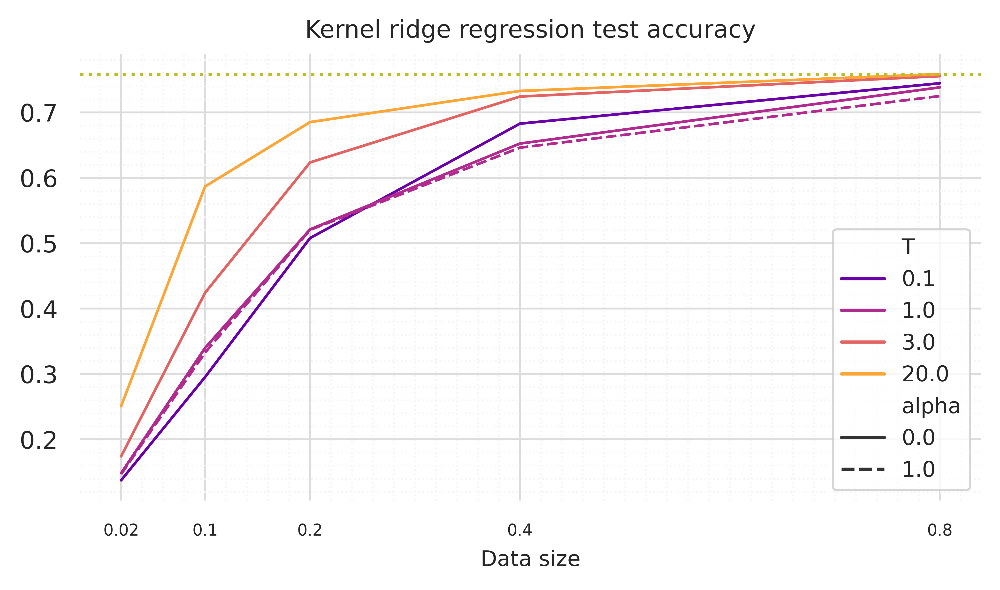

In [72]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(6,3), sharey=True, dpi=800)

    colors = ['orange','royalblue','skyblue','slateblue','mediumpurple','blueviolet','darkviolet', 'purple','mediumvioletred','indigo']

    cmap = plt.get_cmap('Blues', len(TEMPERATURES)+2)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)][2:]
    line_styles = ['dotted','dashed','dashdot','solid']


    sns.lineplot(data=kr_results, x="data_p", y="test_accuracy", errorbar="sd", palette="plasma",
                 hue="T", style="alpha", ax=ax, linewidth = 1.0)
    
    
    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes_p)
    ax.set_xticklabels(data_sizes_p, fontsize=6)

    #ax.set_yscale('symlog',linthresh=10e-1)
    #ax.set_xscale('symlog',linthresh=10e0)
    
    #ax.set_ylim([0.0,150])


    #ax.set_xlim([0,100])

    ax.set_ylabel("", fontsize=8)
    ax.set_xlabel("Data size", fontsize=8)

    ax.axhline(y=teacher_accuracy/100, color="tab:olive", ls=":")

    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='lower right', fontsize=8)
    ax.set_title(f"Kernel ridge regression test accuracy", fontsize=9)


#### How aligned is the network prediction to kernel regression? 

In [101]:
buffer_size = 6000
seed = 11
distillation=True
alpha = 0.0 if distillation else 1.0
temperature = 20. if distillation else 1.0

student = resnet18(num_classes=100)
STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval()
        
model = teacher 
lamda = 1.0 # ridge hyperparameter
train_batches = 20; test_batches = 50 # samples = batches x 128 
centering = False

train_features = get_features(loader, model, device, num_batches=train_batches, center=centering)
test_features = get_features(valloader, model, device, num_batches=test_batches, center=centering)
train_targets = get_targets(loader, device, num_batches=train_batches, model=None, C=100)
test_y_targets = get_targets(valloader, device, num_batches=test_batches, model=None, C=100)


test_kernel_predictions = do_kernel_regression(train_features, test_features, train_targets, lamda)
test_net_predictions = get_targets(valloader, device, num_batches=test_batches, model=model, C=100)

class_kernel_predictions = torch.max(test_kernel_predictions, dim=1)[1]
class_net_predictions = torch.max(test_net_predictions, dim=1)[1]
class_targets = torch.max(test_y_targets, dim=1)[1]

(class_kernel_predictions==class_targets).float().mean(), (class_targets==class_net_predictions).float().mean()

(class_kernel_predictions==class_net_predictions).float().mean()

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-20.0.ckpt


[ 12-22 | 11:12 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1933.06 ep/h | loss: 0.98 ||

tensor(0.9167, device='cuda:3')

In [79]:
teacher_kernel_equality = (class_kernel_predictions==class_net_predictions).float().mean()

In [102]:
teacher_kernel_alignment = torch.trace(torch.matmul(test_kernel_predictions/torch.norm(test_kernel_predictions, dim=1, keepdim=True),\
                         test_net_predictions.T/torch.norm(test_net_predictions.T, dim=0, keepdim=True))).item()
teacher_kernel_alignment

5345.30078125

In [107]:
teacher_kernel_alignment = teacher_kernel_alignment/(50*128)
teacher_kernel_alignment

0.8352032470703125

In [95]:
index = 0 

lamda = 1.0 # ridge hyperparameter
train_batches = 20; test_batches = 50 # samples = batches x 128 
centering = False

start = time.time()

for distillation in [False, True]:
    alpha= 0.0 if distillation else 1.0
    for buffer_size in BUFFER_SIZES:
        for temperature in TEMPERATURES:

            STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
            checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
            
            if checkpoint: 
                    student.load_state_dict(checkpoint['state_dict'])
                    student.to(device)
                    student.eval()
                    
                    model=student

                    train_features = get_features(loader, model, device, num_batches=train_batches, center=centering)
                    test_features = get_features(valloader, model, device, num_batches=test_batches, center=centering)
                    train_targets = get_targets(loader, device, num_batches=train_batches, model=None, C=100)
                    
                    test_kernel_predictions = do_kernel_regression(train_features, test_features, train_targets, lamda)
                    test_net_predictions = get_targets(valloader, device, num_batches=test_batches, model=model, C=100)

                    class_kernel_predictions = torch.max(test_kernel_predictions, dim=1)[1]
                    class_net_predictions = torch.max(test_net_predictions, dim=1)[1]

                    kernel_net_alignment = torch.trace(torch.matmul(test_kernel_predictions/torch.norm(test_kernel_predictions, dim=1, keepdim=True),  
                                                                    test_net_predictions.T/torch.norm(test_net_predictions.T, dim=0, keepdim=True)))

                    kr_results.loc[index, 'kernel_net_alignment'] = kernel_net_alignment.item()
                    index+=1

            check_time = time.time() 
            print(f"Iteration {index} - {check_time - start} s passed")

kr_results

Iteration 0 - 0.0051975250244140625 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-1.0-1.0.ckpt


[ 12-22 | 11:07 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1928.38 ep/h | loss: 0.98 ||

Iteration 1 - 4.465596914291382 s passed
Iteration 1 - 4.467544317245483 s passed
Iteration 1 - 4.467594385147095 s passed
Iteration 1 - 4.4676244258880615 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-1.0-1.0.ckpt


[ 12-22 | 11:07 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1908.21 ep/h | loss: 0.98 ||

Iteration 2 - 8.906646728515625 s passed
Iteration 2 - 8.908540725708008 s passed
Iteration 2 - 8.908595085144043 s passed
Iteration 2 - 8.90863299369812 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-1.0-1.0.ckpt


[ 12-22 | 11:07 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1930.44 ep/h | loss: 0.98 ||

Iteration 3 - 13.338961601257324 s passed
Iteration 3 - 13.341303825378418 s passed
Iteration 3 - 13.341356754302979 s passed
Iteration 3 - 13.341390609741211 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-1.0-1.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1915.63 ep/h | loss: 0.98 ||

Iteration 4 - 17.689999103546143 s passed
Iteration 4 - 17.691972494125366 s passed
Iteration 4 - 17.692012310028076 s passed
Iteration 4 - 17.69204068183899 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1931.37 ep/h | loss: 0.98 ||

Iteration 5 - 22.07237982749939 s passed
Iteration 5 - 22.074005365371704 s passed
Iteration 5 - 22.074064016342163 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-0.1.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1934.47 ep/h | loss: 0.98 ||

Iteration 6 - 26.368062496185303 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-1.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1929.03 ep/h | loss: 0.98 ||

Iteration 7 - 30.728863954544067 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-3.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1925.39 ep/h | loss: 0.98 ||

Iteration 8 - 35.06243371963501 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-20.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1932.15 ep/h | loss: 0.98 ||

Iteration 9 - 39.45292830467224 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-0.1.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1926.89 ep/h | loss: 0.98 ||

Iteration 10 - 43.834649085998535 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-1.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1930.65 ep/h | loss: 0.98 ||

Iteration 11 - 48.28390383720398 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-3.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1926.55 ep/h | loss: 0.98 ||

Iteration 12 - 52.73027491569519 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-20.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1914.06 ep/h | loss: 0.98 ||

Iteration 13 - 57.22450137138367 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-0.1.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1921.81 ep/h | loss: 0.98 ||

Iteration 14 - 61.71379470825195 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-1.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1933.47 ep/h | loss: 0.98 ||

Iteration 15 - 66.12475204467773 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-3.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1935.19 ep/h | loss: 0.98 ||

Iteration 16 - 70.5893726348877 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-20.0.ckpt


[ 12-22 | 11:08 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1929.65 ep/h | loss: 0.98 ||

Iteration 17 - 74.95216822624207 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-0.1.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1925.78 ep/h | loss: 0.98 ||

Iteration 18 - 79.5009868144989 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-1.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1935.15 ep/h | loss: 0.98 ||

Iteration 19 - 83.98005104064941 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-3.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1805.31 ep/h | loss: 0.98 ||

Iteration 20 - 88.50769710540771 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-20.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1893.99 ep/h | loss: 0.98 ||

Iteration 21 - 93.00717782974243 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-0.1.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1907.03 ep/h | loss: 0.98 ||

Iteration 22 - 97.43985629081726 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-1.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1929.37 ep/h | loss: 0.98 ||

Iteration 23 - 101.89164566993713 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-3.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1935.63 ep/h | loss: 0.98 ||

Iteration 24 - 106.37556552886963 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


[ 12-22 | 11:09 ] Task Collecting targets | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1925.75 ep/h | loss: 0.98 ||

Iteration 25 - 110.85365509986877 s passed


,alpha,data,seed,temperature,test_accuracy,T,data_p,kernel_net_equality,kernel_net_alignment
0,1.0,1200,11,1.0,0.146875,1.0,0.02,0.189687,2692.161621
1,1.0,6000,11,1.0,0.332813,1.0,0.1,0.513906,4101.732910
2,1.0,12000,11,1.0,0.520312,1.0,0.2,0.719531,4892.716797
3,1.0,24000,11,1.0,0.646094,1.0,0.4,0.841094,5256.084473
4,1.0,48000,11,1.0,0.725000,1.0,0.8,0.909375,5370.713867
5,0.0,1200,11,0.1,0.137500,0.1,0.02,0.184375,2158.250488
6,0.0,1200,11,1.0,0.148438,1.0,0.02,0.201875,2768.518555
7,0.0,1200,11,3.0,0.174219,3.0,0.02,0.318750,3154.452881
8,0.0,1200,11,20.0,0.250781,20.0,0.02,0.499844,4141.030273
9,0.0,6000,11,0.1,0.295312,0.1,0.1,0.522344,4475.299805


In [333]:
#kr_results['kernel_net_alignment'] = kr_results['kernel_net_alignment']/(50*128)
kr_results

,alpha,data,seed,temperature,test_accuracy,T,data_p,kernel_net_equality,kernel_net_alignment
0,1.0,1200,11,1.0,0.146875,1.0,0.02,0.189687,0.420650
1,1.0,6000,11,1.0,0.332813,1.0,0.1,0.513906,0.640896
2,1.0,12000,11,1.0,0.520312,1.0,0.2,0.719531,0.764487
3,1.0,24000,11,1.0,0.646094,1.0,0.4,0.841094,0.821263
4,1.0,48000,11,1.0,0.725000,1.0,0.8,0.909375,0.839174
5,0.0,1200,11,0.1,0.137500,0.1,0.02,0.184375,0.337227
6,0.0,1200,11,1.0,0.148438,1.0,0.02,0.201875,0.432581
7,0.0,1200,11,3.0,0.174219,3.0,0.02,0.318750,0.492883
8,0.0,1200,11,20.0,0.250781,20.0,0.02,0.499844,0.647036
9,0.0,6000,11,0.1,0.295312,0.1,0.1,0.522344,0.699266


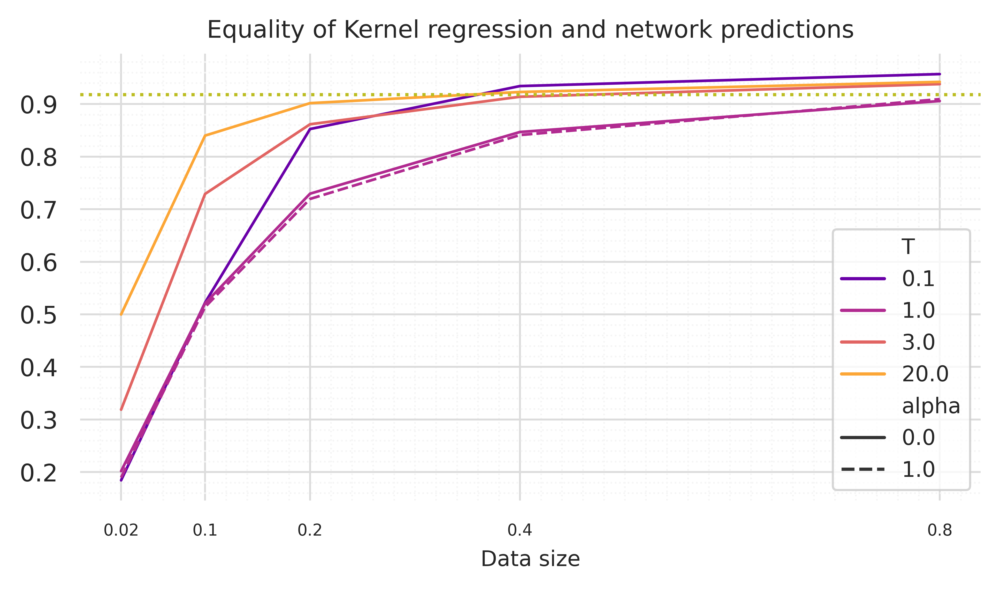

In [336]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(6,3), sharey=True, dpi=800)

    colors = ['orange','royalblue','skyblue','slateblue','mediumpurple','blueviolet','darkviolet', 'purple','mediumvioletred','indigo']

    cmap = plt.get_cmap('Blues', len(TEMPERATURES)+2)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)][2:]
    line_styles = ['dotted','dashed','dashdot','solid']


    sns.lineplot(data=kr_results, x="data_p", y="kernel_net_equality", errorbar="sd", palette="plasma",
                 hue="T", style="alpha", ax=ax, linewidth = 1.0)
    
    
    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes_p)
    ax.set_xticklabels(data_sizes_p, fontsize=6)

    #ax.set_yscale('symlog',linthresh=10e-1)
    #ax.set_xscale('symlog',linthresh=10e0)
    
    #ax.set_ylim([0.0,150])


    #ax.set_xlim([0,100])

    ax.set_ylabel("", fontsize=8)
    ax.set_xlabel("Data size", fontsize=8)

    ax.axhline(y=teacher_kernel_equality.cpu(), color="tab:olive", ls=":")

    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='lower right', fontsize=8)
    ax.set_title(f"Equality of Kernel regression and network predictions", fontsize=9)


In [ ]:
# problem here: two different results!!

#### Spectral analysis 

In [109]:
spectra_df = pd.DataFrame(columns=['E','alpha','data','seed','temperature'])
spectra_df

,E,alpha,data,seed,temperature


In [110]:
BUFFER_SIZES = [1200, 6000, 12000, 24000, 48000]
TEMPERATURES = [0.1, 1.0, 3.0, 20.0]

MAX_RANK = 512 # Maximum feature kernel rank -> number of eigenvalues to keep 
BATCHES = 20 #-> 15x128 data points 

In [111]:
seed = 11


index = 0 

progress_bar = ProgressBar(verbose=True)

total_num = len(BUFFER_SIZES)*len(TEMPERATURES)*2
start = time.time()

student = resnet18(num_classes=100)

for alpha in [0.0,1.0]:
    for buffer_size in BUFFER_SIZES:
        for temperature in TEMPERATURES:
            STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
            checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
            if checkpoint: 
                    student.load_state_dict(checkpoint['state_dict'])
                    student.to(device)
                    student.eval()
                    with torch.no_grad():
                        # note: we are centering the features before computing the kernel!
                        K = compute_empirical_kernel(loader, student, device=device, num_batches=NUM_BATCHES, silent=True, center=True)
                        E = np.flip(np.sort(torch.linalg.eigvalsh(K).cpu().numpy()))[:MAX_RANK]
        
                    spectra_df.loc[index] = [E, alpha, buffer_size, seed, temperature]
                    index+=1

            progress_bar.prog(index, total_num, -1, 'Computing spectra', index/total_num)  
            check_time = time.time() 
            print(f"Iteration {index} - {check_time - start} s passed")

            
            #if index>3: raise Exception("limit reached")



Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-0.1.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |██┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.025 |93333333 |

Iteration 1 - 0.9845860004425049 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-1.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |███┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.05 |93333333 ||

Iteration 2 - 1.840790033340454 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-3.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |█████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.075 |93333333 |

Iteration 3 - 2.7504329681396484 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-20.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.1 |0.93333333 |

Iteration 4 - 3.6087074279785156 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-0.1.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |███████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.125 |93333333 |

Iteration 5 - 4.4746997356414795 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-1.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.15 |.93333333 |

Iteration 6 - 5.335707187652588 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-3.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |██████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.175 |93333333 |

Iteration 7 - 6.259336233139038 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-20.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |███████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.2 |0.93333333 |

Iteration 8 - 7.19529128074646 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-0.1.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.225 |93333333 |

Iteration 9 - 8.085094690322876 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-1.0.ckpt


[ 12-22 | 11:14 ] Task Computing spectra | epoch -1: |█████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.25 |.93333333 |

Iteration 10 - 8.916710376739502 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-3.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |███████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.275 |93333333 |

Iteration 11 - 9.755658149719238 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-20.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.3 |0.93333333 |

Iteration 12 - 10.59873628616333 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-0.1.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |█████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.325 |93333333 |

Iteration 13 - 11.456174612045288 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |██████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.35 |.93333333 |

Iteration 14 - 12.304155588150024 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-3.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.375 |93333333 |

Iteration 15 - 13.16750717163086 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-20.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |█████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.4 |0.93333333 |

Iteration 16 - 14.051602602005005 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-0.1.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |██████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.425 |93333333 |

Iteration 17 - 14.918061256408691 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |███████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.45 |.93333333 |

Iteration 18 - 15.801207542419434 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-3.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |█████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.475 |93333333 |

Iteration 19 - 16.704068899154663 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |██████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.5 |0.93333333 |

Iteration 20 - 17.56436324119568 s passed
Iteration 20 - 17.56630516052246 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-1.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |███████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.525 |93333333 |

Iteration 21 - 18.412720203399658 s passed
Iteration 21 - 18.414611339569092 s passed
Iteration 21 - 18.41540002822876 s passed
Iteration 21 - 18.41635251045227 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-1.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.55 |.93333333 |

Iteration 22 - 19.243446588516235 s passed
Iteration 22 - 19.245699405670166 s passed
Iteration 22 - 19.246485710144043 s passed
Iteration 22 - 19.247432947158813 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-1.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |██████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.575 |93333333 |

Iteration 23 - 20.07870626449585 s passed
Iteration 23 - 20.080914735794067 s passed
Iteration 23 - 20.081859350204468 s passed
Iteration 23 - 20.082746505737305 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-1.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.6 |0.93333333 |

Iteration 24 - 20.911077737808228 s passed
Iteration 24 - 20.91307258605957 s passed
Iteration 24 - 20.913798332214355 s passed
Iteration 24 - 20.914672374725342 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


[ 12-22 | 11:15 ] Task Computing spectra | epoch -1: |████████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.625 |93333333 |

Iteration 25 - 21.755584716796875 s passed
Iteration 25 - 21.75747561454773 s passed
Iteration 25 - 21.758296251296997 s passed


In [112]:
spectra_df.head(5)

,E,alpha,data,seed,temperature
0,"[74.57855, 63.080204, 52.88801, 44.460716, 40....",0.0,1200,11,0.1
1,"[76.716156, 62.551422, 59.35245, 57.016163, 49...",0.0,1200,11,1.0
2,"[63.36541, 58.658504, 48.850952, 48.28783, 41....",0.0,1200,11,3.0
3,"[54.357334, 50.425587, 39.37014, 35.95319, 29....",0.0,1200,11,20.0
4,"[53.796093, 46.464756, 40.257607, 32.28887, 29...",0.0,6000,11,0.1


In [113]:
logs_path = './logs/results/cifar100/resnet18/spectra.json'
spectra_df.to_json(logs_path)

In [110]:
spectra_df = pd.read_json(logs_path)
spectra_df

,E,alpha,data,seed,temperature
0,"[75.6517486572, 65.1636962891, 54.40284729, 46...",0,1200,11,0.1
1,"[76.3480224609, 67.1110687256, 62.8965072632, ...",0,1200,11,1.0
2,"[76.6322021484, 60.9241790771, 53.516658783, 4...",0,1200,11,3.0
3,"[71.9127349854, 54.907699585, 48.9838562012, 3...",0,1200,11,20.0
4,"[59.8949966431, 50.572227478, 41.43567276, 34....",0,6000,11,0.1
5,"[65.0550994873, 55.7096862793, 49.2513542175, ...",0,6000,11,1.0
6,"[87.1082000732, 68.9119110107, 62.4496040344, ...",0,6000,11,3.0
7,"[85.9530181885, 66.2499084473, 64.2985076904, ...",0,6000,11,20.0
8,"[80.0827789307, 75.5587158203, 62.3036575317, ...",0,12000,11,0.1
9,"[68.0969085693, 62.5386505127, 53.3882980347, ...",0,12000,11,1.0


In [114]:
working_df = spectra_df.copy()
working_df['T']= working_df['temperature'].astype('category')

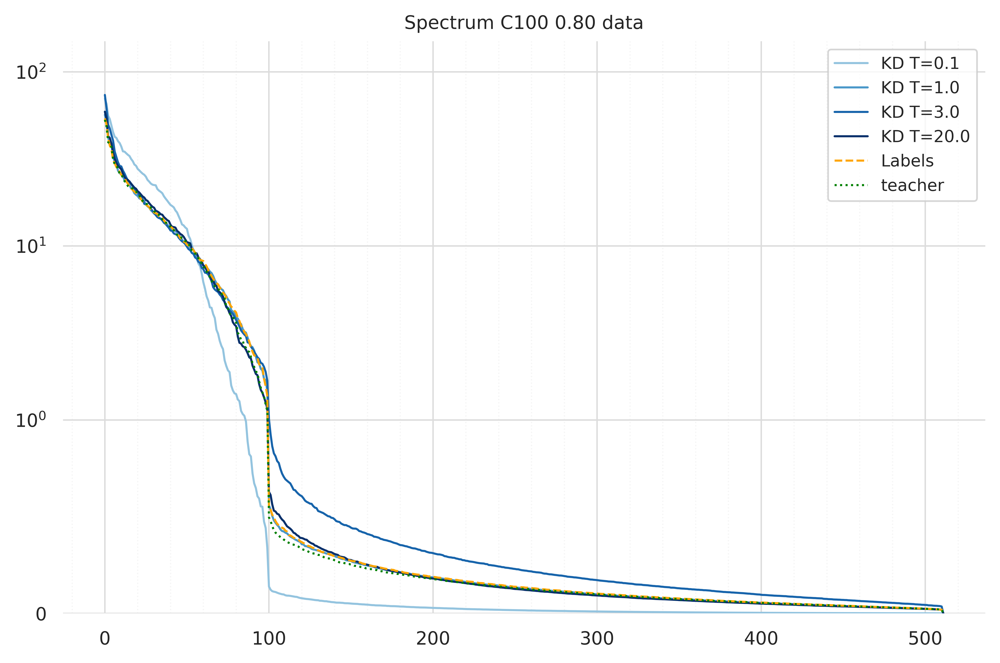

In [288]:
# Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(8,5), sharey=True, dpi=800)

    colors = ['orange','royalblue','skyblue','slateblue','mediumpurple','blueviolet','darkviolet', 'purple','mediumvioletred','indigo']

    cmap = plt.get_cmap('Blues', len(TEMPERATURES)+2)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)][2:]
    line_styles = ['dotted','dashed','dashdot','solid']


    x = range(MAX_RANK)
    B = 48000

    

    for A in [0.0, 1.0]:
        dfA = spectra_df.loc[spectra_df['alpha']==A]
        # for j,B in enumerate(BUFFER_SIZES):
        #     #dfB = dfA.loc[dfA['data']==B]
        dfB = dfA.loc[dfA['data']==B]
        for i,T in enumerate(TEMPERATURES):
                dfT = dfB.loc[dfB['temperature']==T]
                # if A==0.0: dfT = dfB.loc[dfB['temperature']==20.0]
                # else: dfT = dfB.loc[dfB['temperature']==1.0]
                if len(dfT)>0:

                    
                    marker = 'o' if A==0.0 else '*' 
                    color = color_list[i] if A==0.0 else 'orange'
                    ls = 'dashed' if A==1.0 else 'solid' #line_styles[i]
                    name = ("KD"+ f" T={T}" if A==0.0 else "Labels")  

            
                    sns.lineplot(x = x, y=dfT['E'].values[0], errorbar="sd", 
                                 color=color, ls=ls, ax=ax, linewidth = 1.0, label=name)
    
    
    sns.lineplot(x = x, y=np.flip(np.sort(spectrum_T))[:MAX_RANK], errorbar="sd", 
                    color='green', ls='dotted', ax=ax, linewidth = 1.0, label="teacher")
    

    ax.set_yscale('symlog',linthresh=10e-1)
    #ax.set_xscale('symlog',linthresh=10e0)
    
    ax.set_ylim([0.0,150])


    #ax.set_xlim([0,100])

    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=8)
    ax.set_title(f"Spectrum C100 {B/60000:0.2f} data", fontsize=9)


In [119]:
spectrum_T

array([ 5.2999603e+01,  4.8679501e+01,  3.9423985e+01, ...,
        7.8037445e-08,  4.8831449e-08, -5.0458828e-09], dtype=float32)

In [120]:
spectral_differences = pd.DataFrame(columns=['alpha','data','seed','temperature'])
index=0
for alpha in [0.0,1.0]:
    dfA = spectra_df.loc[spectra_df['alpha']==alpha]
    for buffer_size in BUFFER_SIZES:
        dfB = dfA.loc[dfA['data']==buffer_size]
        for temperature in TEMPERATURES:
            dfT = dfB.loc[dfB['temperature']==temperature]

            if len(dfT)>0: 
                    spectral_differences.loc[index,['alpha','data','seed','temperature']] = [alpha, buffer_size, seed, temperature]
                    for K in range(100):
                        delta_K = np.abs(dfT['E'].values[0][K].real - spectrum_T[K].real)
                        spectral_differences.loc[index,f'delta_{K}'] = delta_K
                    index+=1
spectral_differences

/tmp/ipykernel_504231/3467342725.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  spectral_differences.loc[index,f'delta_{K}'] = delta_K


,alpha,data,seed,temperature,delta_0,delta_1,delta_2,delta_3,delta_4,delta_5,...,delta_90,delta_91,delta_92,delta_93,delta_94,delta_95,delta_96,delta_97,delta_98,delta_99
0,0.0,1200,11,0.1,21.578949,14.400703,13.464024,5.721012,3.738060,6.330023,...,1.475981,1.394276,1.291407,1.237861,1.080099,0.950507,0.857373,0.798193,0.667263,0.576940
1,0.0,1200,11,1.0,23.716553,13.871922,19.928467,18.276459,12.857388,16.941244,...,1.169314,1.117426,1.023162,0.975193,0.827468,0.704834,0.622241,0.558407,0.420470,0.345931
2,0.0,1200,11,3.0,10.365807,9.979004,9.426968,9.548126,4.569145,7.227327,...,0.278620,0.292826,0.361439,0.370903,0.521980,0.639231,0.694544,0.755863,0.813028,0.894102
3,0.0,1200,11,20.0,1.357731,1.746086,0.053844,2.786514,7.281162,3.701117,...,0.379871,0.370706,0.292250,0.288229,0.152005,0.074979,0.008999,0.036498,0.140893,0.191164
4,0.0,6000,11,0.1,0.796490,2.214745,0.833622,6.450832,7.443769,5.773048,...,0.538674,0.498505,0.413806,0.382399,0.240188,0.144693,0.136109,0.076818,0.020501,0.082879
5,0.0,6000,11,1.0,4.928711,4.642448,8.211540,5.171417,2.315865,1.219770,...,0.050945,0.019468,0.056492,0.079151,0.176157,0.248340,0.320784,0.376919,0.516573,0.543790
6,0.0,6000,11,3.0,13.812340,13.525372,13.786888,10.932747,1.732792,2.785002,...,0.966511,0.948555,1.041840,1.030004,1.108462,1.204262,1.237584,1.247427,1.371451,1.397859
7,0.0,6000,11,20.0,10.264359,11.106499,9.960262,5.900166,2.602684,0.839079,...,0.164216,0.187031,0.092153,0.102196,0.024411,0.056090,0.031311,0.042198,0.160957,0.219889
8,0.0,12000,11,0.1,22.024399,18.056736,15.947750,12.644375,6.358891,6.273783,...,1.012381,0.967869,0.875090,0.912189,0.780256,0.703391,0.678136,0.686549,0.611556,0.592943
9,0.0,12000,11,1.0,4.661770,6.479324,7.453915,3.469997,0.141289,0.327688,...,0.226375,0.221307,0.186123,0.230225,0.071052,0.032288,0.071764,0.106228,0.222675,0.262378


In [121]:
data_sizes = sorted(working_df['data'].unique())
data_sizes


[1200, 6000, 12000, 24000, 48000]

In [122]:
spectral_differences
working_df = spectral_differences.copy()
working_df['T']= working_df['temperature'].astype('category')

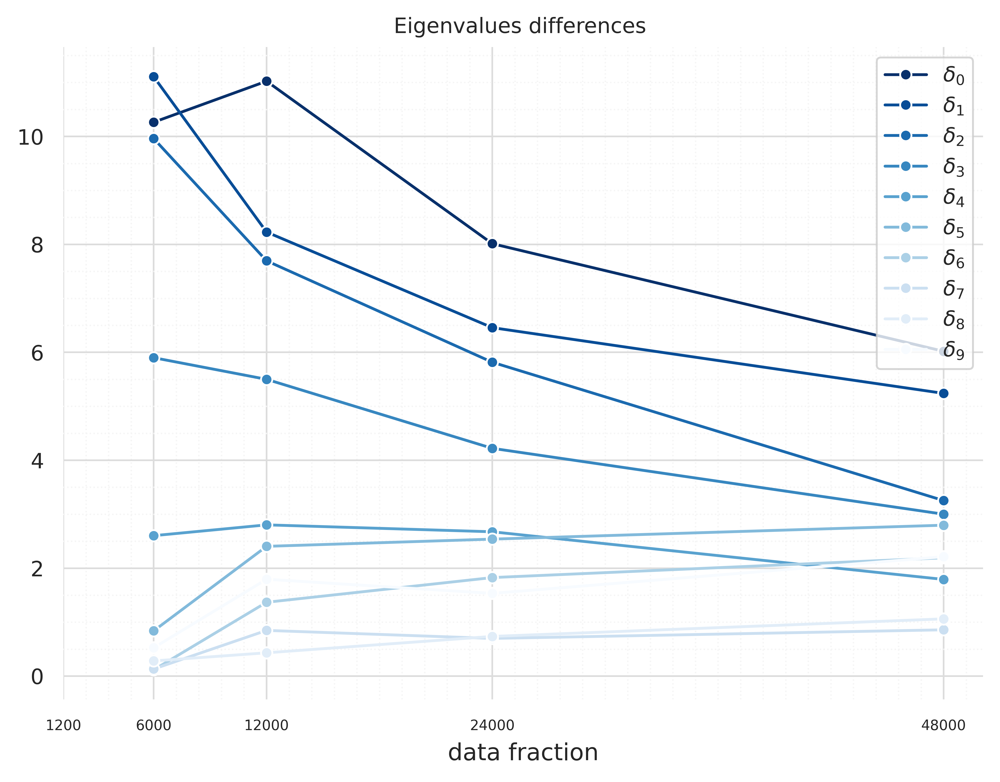

In [125]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(7,5), sharey=True, dpi=800)

    Range = 10

    cmap = plt.get_cmap('Blues_r', Range)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    line_styles = ['dotted','dashed','dashdot','solid']

    _df = working_df.loc[working_df['temperature']==20]
    _df = _df.loc[_df['data']>1200]
    for K in range(Range):
        g = sns.lineplot(data=_df, x="data", y=f"delta_{K}", errorbar="sd",
                    markers=True, marker='o', color=color_list[K],
                    ax=ax, label=r"$\delta_{}$".format(K))

    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes)
    #ax.set_xticklabels(['']+[ f'{l}' for l in buffer_sizes_p[0:]], fontsize=6)
    ax.set_xticklabels(data_sizes, fontsize=6)
    ax.tick_params(axis='x',  rotation=0)

    #yticks = [10.0, 25., 50., 70, teacher_val_accuracy, 90., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels(yticks, fontsize=6)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'data fraction', fontsize=10, y=+1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #plt.legend([],[], frameon=False)

    ax.set_title("Eigenvalues differences ", fontsize=9)

In [126]:
index=0
for alpha in [0.0,1.0]:
    dfA = spectra_df.loc[spectra_df['alpha']==alpha]
    for buffer_size in BUFFER_SIZES:
        dfB = dfA.loc[dfA['data']==buffer_size]
        for temperature in TEMPERATURES:
            dfT = dfB.loc[dfB['temperature']==temperature]

            if len(dfT)>0: 
                    delta_cumulative_100 = np.mean(np.abs(dfT['E'].values[0][:100].real - spectrum_T[:100].real))
                    spectral_differences.loc[index,'delta_cumulative_100'] = delta_cumulative_100
                    delta_cumulative_512 = np.mean(np.abs(dfT['E'].values[0][:512].real - spectrum_T[:512].real))
                    spectral_differences.loc[index,'delta_cumulative_all'] = delta_cumulative_512
                    index+=1
spectral_differences

/tmp/ipykernel_504231/3738349141.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  spectral_differences.loc[index,'delta_cumulative_100'] = delta_cumulative_100
/tmp/ipykernel_504231/3738349141.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  spectral_differences.loc[index,'delta_cumulative_all'] = delta_cumulative_512


,alpha,data,seed,temperature,delta_0,delta_1,delta_2,delta_3,delta_4,delta_5,...,delta_92,delta_93,delta_94,delta_95,delta_96,delta_97,delta_98,delta_99,delta_cumulative_100,delta_cumulative_all
0,0.0,1200,11,0.1,21.578949,14.400703,13.464024,5.721012,3.738060,6.330023,...,1.291407,1.237861,1.080099,0.950507,0.857373,0.798193,0.667263,0.576940,6.450313,1.275418
1,0.0,1200,11,1.0,23.716553,13.871922,19.928467,18.276459,12.857388,16.941244,...,1.023162,0.975193,0.827468,0.704834,0.622241,0.558407,0.420470,0.345931,5.338817,1.084798
2,0.0,1200,11,3.0,10.365807,9.979004,9.426968,9.548126,4.569145,7.227327,...,0.361439,0.370903,0.521980,0.639231,0.694544,0.755863,0.813028,0.894102,3.080120,0.907424
3,0.0,1200,11,20.0,1.357731,1.746086,0.053844,2.786514,7.281162,3.701117,...,0.292250,0.288229,0.152005,0.074979,0.008999,0.036498,0.140893,0.191164,4.066622,0.908773
4,0.0,6000,11,0.1,0.796490,2.214745,0.833622,6.450832,7.443769,5.773048,...,0.413806,0.382399,0.240188,0.144693,0.136109,0.076818,0.020501,0.082879,4.149499,0.918775
5,0.0,6000,11,1.0,4.928711,4.642448,8.211540,5.171417,2.315865,1.219770,...,0.056492,0.079151,0.176157,0.248340,0.320784,0.376919,0.516573,0.543790,2.658856,0.730742
6,0.0,6000,11,3.0,13.812340,13.525372,13.786888,10.932747,1.732792,2.785002,...,1.041840,1.030004,1.108462,1.204262,1.237584,1.247427,1.371451,1.397859,2.258750,0.808640
7,0.0,6000,11,20.0,10.264359,11.106499,9.960262,5.900166,2.602684,0.839079,...,0.092153,0.102196,0.024411,0.056090,0.031311,0.042198,0.160957,0.219889,2.043353,0.484283
8,0.0,12000,11,0.1,22.024399,18.056736,15.947750,12.644375,6.358891,6.273783,...,0.875090,0.912189,0.780256,0.703391,0.678136,0.686549,0.611556,0.592943,2.837378,0.597291
9,0.0,12000,11,1.0,4.661770,6.479324,7.453915,3.469997,0.141289,0.327688,...,0.186123,0.230225,0.071052,0.032288,0.071764,0.106228,0.222675,0.262378,2.311016,0.583699


In [129]:
working_df = spectral_differences.copy()
working_df['T']= working_df['temperature'].astype('category')

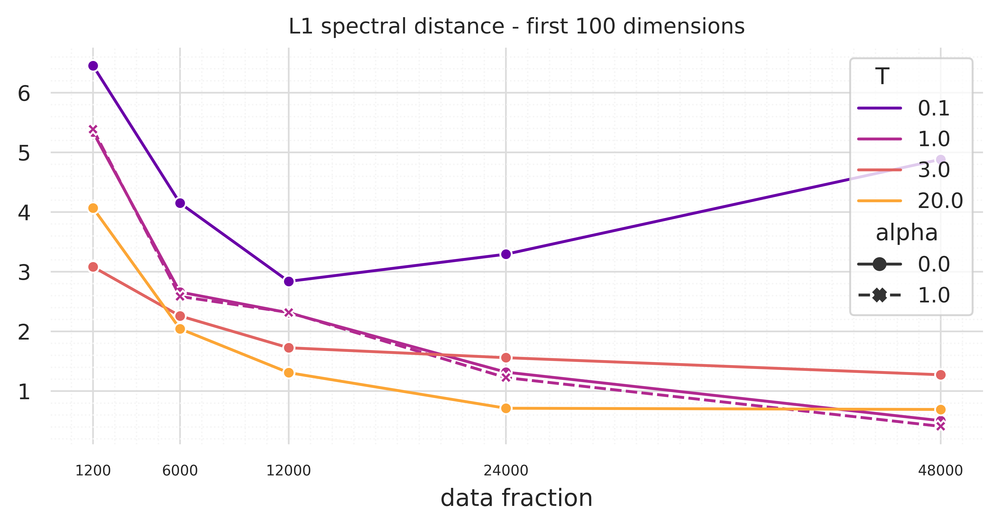

In [132]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(7,3), sharey=True, dpi=800)


    cmap = plt.get_cmap('Blues_r', Range)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    line_styles = ['dotted','dashed','dashdot','solid']

    #_df = working_df.loc[working_df['temperature']==20]
    #_df = _df.loc[_df['data']>1200]
    g = sns.lineplot(data=working_df, x="data", y="delta_cumulative_100", errorbar="sd",
                    markers=True, marker='o', hue='T', style='alpha', palette='plasma',
                    ax=ax)
    
    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes)
    #ax.set_xticklabels(['']+[ f'{l}' for l in buffer_sizes_p[0:]], fontsize=6)
    ax.set_xticklabels(data_sizes, fontsize=6)
    ax.tick_params(axis='x',  rotation=0)

    #yticks = [10.0, 25., 50., 70, teacher_val_accuracy, 90., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels(yticks, fontsize=6)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'data fraction', fontsize=10, y=+1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #plt.legend([],[], frameon=False)

    ax.set_title("L1 spectral distance - first 100 dimensions", fontsize=9)

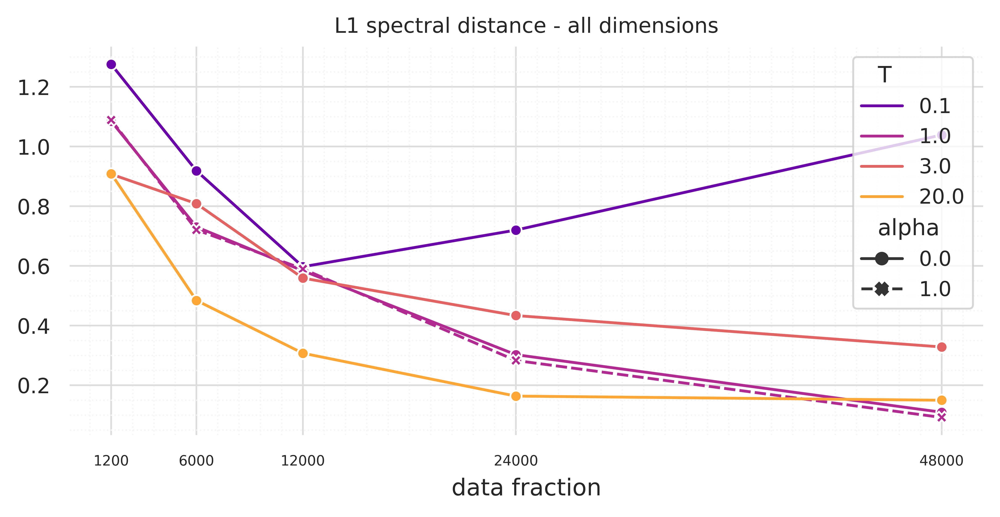

In [133]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(7,3), sharey=True, dpi=800)


    cmap = plt.get_cmap('Blues_r', Range)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    line_styles = ['dotted','dashed','dashdot','solid']

    #_df = working_df.loc[working_df['temperature']==20]
    #_df = _df.loc[_df['data']>1200]
    g = sns.lineplot(data=working_df, x="data", y="delta_cumulative_all", errorbar="sd",
                    markers=True, marker='o', hue='T', style='alpha', palette='plasma',
                    ax=ax)
    
    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes)
    #ax.set_xticklabels(['']+[ f'{l}' for l in buffer_sizes_p[0:]], fontsize=6)
    ax.set_xticklabels(data_sizes, fontsize=6)
    ax.tick_params(axis='x',  rotation=0)

    #yticks = [10.0, 25., 50., 70, teacher_val_accuracy, 90., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels(yticks, fontsize=6)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'data fraction', fontsize=10, y=+1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #plt.legend([],[], frameon=False)

    ax.set_title("L1 spectral distance - all dimensions", fontsize=9)

## Target kernel alignment

### CIFAR100

In [134]:
NUM_BATCHES=15

In [135]:

C100_train, C100_val = load_dataset('cifar100', augment=False)
all_data = ConcatDataset([C100_train, C100_val])
shuffled_train = torch.utils.data.Subset(C100_train, torch.randperm(len(C100_train)).tolist())
loader = DataLoader(shuffled_train, batch_size=128, shuffle=False, num_workers=4, pin_memory=False)

In [136]:
def load_checkpoint(best=False, filename='checkpoint.pth.tar', distributed=False, device=None):
    path = base_path() + "chkpts" + "/" + "cifar100" + "/" + "resnet18/"
    if best: filepath = path + 'model_best.ckpt'
    else: filepath = path + filename
    if os.path.exists(filepath):
          print(f"Loading existing checkpoint {filepath}")
          checkpoint = torch.load(filepath, map_location=device)
          return checkpoint
    return None 

In [173]:
targets = get_targets(loader, device, num_batches=NUM_BATCHES)
KY = compute_empirical_kernel_from_features(targets)

[ 12-22 | 11:28 ] Task Collecting targets | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 1040.52 ep/h | loss: 0.93333333 |

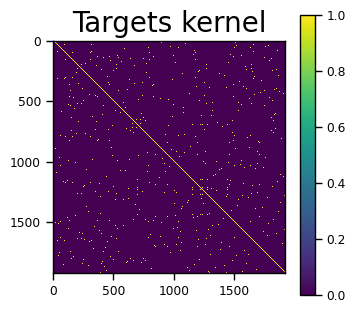

In [175]:
plot_matrix(KY.cpu(), r'Targets kernel', size=(3,4));

Loading the teacher and computing the kernel

In [176]:
# initialising the model
teacher = resnet18(num_classes=100)
#teacher = make_cnn(c=150, num_classes=100, use_batch_norm=True)
CHKPT_NAME = 'resnet18-teacher.ckpt'
#CHKPT_NAME = 'convnet150-teacher.ckpt'
checkpoint = load_checkpoint(best=False, filename=CHKPT_NAME, device=device) 
if checkpoint: 
        teacher.load_state_dict(checkpoint['state_dict'])
        teacher.to(device)
teacher.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-teacher.ckpt


In [177]:
KT = compute_empirical_kernel(loader, teacher, device=device, num_batches=NUM_BATCHES)

[ 12-22 | 11:29 ] Task Collecting features | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 379.52 ep/h | loss: 0.93333333 |

In [186]:
targets_T = get_targets(loader, device, model=teacher, num_batches=NUM_BATCHES)
KT_target = compute_empirical_kernel_from_features(targets_T)

[ 12-22 | 11:29 ] Task Collecting targets | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 370.42 ep/h | loss: 0.93333333 |

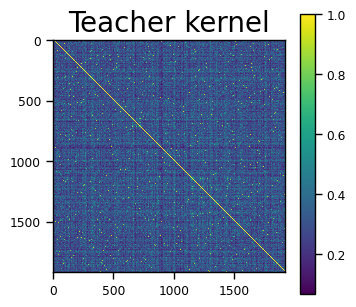

In [142]:
plot_matrix(KT.cpu(), r'Teacher kernel', size=(3,4));

Loading the students and computing kernels

In [324]:
buffer_size = 48000
seed = 11

student = resnet18(num_classes=100)


In [325]:
alpha = 0.0
temperature = 20.
STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


In [326]:
KS0 = compute_empirical_kernel(loader, student, device=device, num_batches=NUM_BATCHES)
targets_S0 = get_targets(loader, device, model=student, num_batches=NUM_BATCHES)
KS0_target = compute_empirical_kernel_from_features(targets_S0)
errors_S0 = F.softmax(targets_S0, dim=1)-F.softmax(targets_T)

[ 12-22 | 12:01 ] Task Collecting targets | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 379.43 ep/h | loss: 0.93333333 ||/tmp/ipykernel_504231/1707378588.py:4: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  errors_S0 = F.softmax(targets_S0, dim=1)-F.softmax(targets_T)


In [327]:
student = resnet18(num_classes=100)
alpha = 1.0
temperature = 1.
STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
if checkpoint: 
        student.load_state_dict(checkpoint['state_dict'])
        student.to(device)
student.eval();

Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


In [328]:
KS1 = compute_empirical_kernel(loader, student, device=device, num_batches=NUM_BATCHES)
targets_S1 = get_targets(loader, device, model=student, num_batches=NUM_BATCHES)
KS1_target = compute_empirical_kernel_from_features(targets_S1)
errors_S1 = F.softmax(targets_S1, dim=1)-F.softmax(targets_T)

[ 12-22 | 12:01 ] Task Collecting targets | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 372.56 ep/h | loss: 0.93333333 ||/tmp/ipykernel_504231/1205822377.py:4: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  errors_S1 = F.softmax(targets_S1, dim=1)-F.softmax(targets_T)


In [329]:
centered_kernal_alignment(KY,KT_target), centered_kernal_alignment(KY,KS0_target), centered_kernal_alignment(KY,KS1_target)

(tensor(0.4499, device='cuda:3'),
 tensor(0.4606, device='cuda:3'),
 tensor(0.4447, device='cuda:3'))

In [330]:
centered_kernal_alignment(KS0,KT),centered_kernal_alignment(KS1,KT)

(tensor(0.9343, device='cuda:3'), tensor(0.7677, device='cuda:3'))

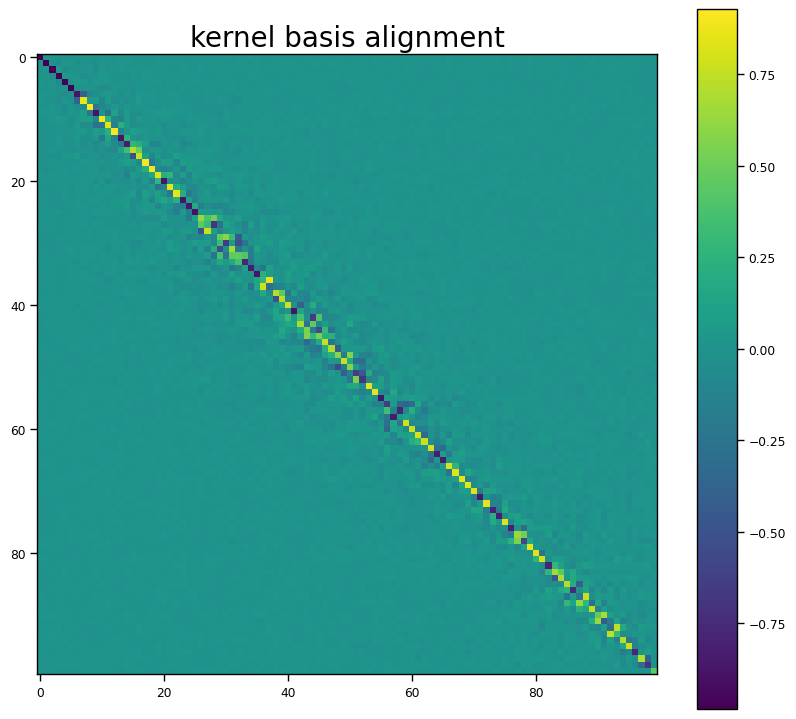

In [331]:
M = kernel_basis_alignment(KS0_target, KT_target).cpu()
M = np.flip(M.numpy())
plot_matrix(M[:100,:100],title="kernel basis alignment");

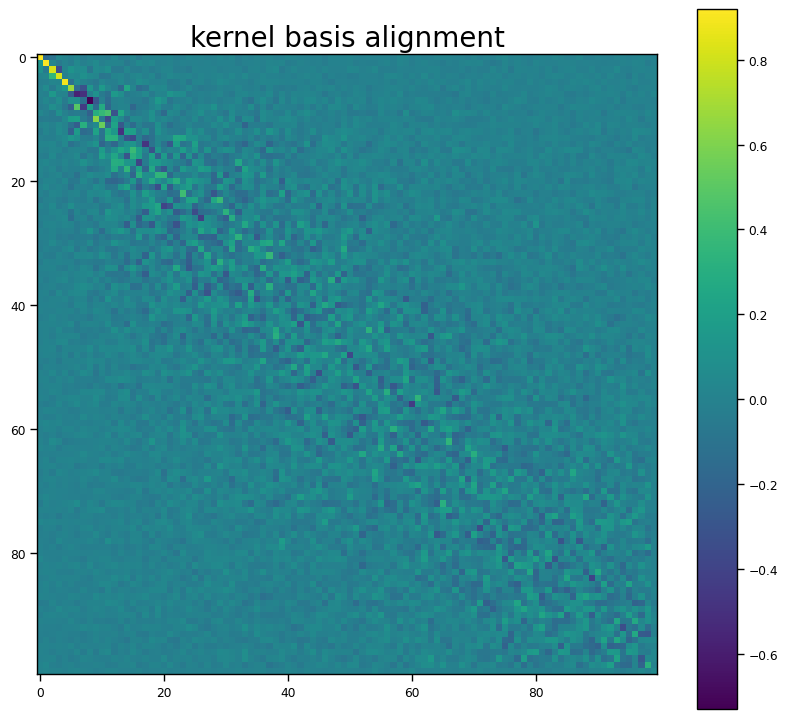

In [332]:
M = kernel_basis_alignment(KS1_target, KT_target).cpu()
M = np.flip(M.numpy())
plot_matrix(M[:100,:100],title="kernel basis alignment");

In [200]:
def low_rank_approximation(M, K):
    """
        M: matrix (torch tensor)
        K: rank to approximate it to"""
    D = M.shape[0]
    L, Q = torch.linalg.eigh(M)
    D = torch.diag(L[-K:]).to(M.device)
    Mk = Q[:,-K:] @ D @ Q[:,-K:].T
    return Mk
    

testing the function ...

In [201]:
KS0_lr = low_rank_approximation(KS0, K=1920)
centered_kernal_alignment(KS0_lr,KY)

tensor(0.5759, device='cuda:3')

In [202]:
KS0_lr = low_rank_approximation(KS0, K=1900)
centered_kernal_alignment(KS0_lr,KY)

tensor(0.5759, device='cuda:3')

In [203]:
KS0_lr = low_rank_approximation(KS0, K=99)
centered_kernal_alignment(KS0_lr,KY)

tensor(0.5745, device='cuda:3')

In [204]:
def get_cumulative_alignments(K, L, min=0, max=100, step=1):
    alignments = []

    for k in tqdm(range(min, max, step)):
        K_lr = low_rank_approximation(K, K=k)
        ka = centered_kernal_alignment(K_lr,L)
        alignments.append(ka.item())
    return alignments

In [205]:
alignments_S0 = get_cumulative_alignments(KS0, KY, min=10, max=512, step=30)

100%|██████████| 17/17 [00:02<00:00,  6.68it/s]


In [206]:
alignments_S1 = get_cumulative_alignments(KS1, KY, min=10, max=512, step=30)

100%|██████████| 17/17 [00:02<00:00,  6.67it/s]


In [207]:
alignments_T = get_cumulative_alignments(KT, KY, min=10, max=512, step=30)

100%|██████████| 17/17 [00:02<00:00,  6.68it/s]


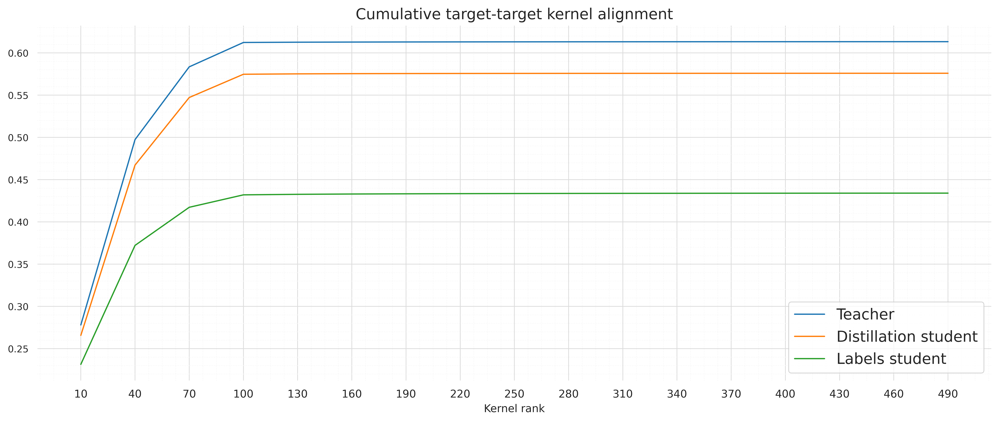

In [208]:
 # Show the results for the first time series and its subseries
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(16,6), sharey=True, dpi=600)
    i = list(range(10, 512, 30))
    plt.plot(i, alignments_T, '-', label='Teacher', ms=0.5)
    plt.plot(i, alignments_S0, '-', label='Distillation student')
    plt.plot(i, alignments_S1, '-', label='Labels student')

    #ax.set_yscale('symlog',linthresh=10e-2)
    #x.set_xscale('symlog',linthresh=10e-2)
    
    #ax.set_ylim([0.0,1.0])

    #ax.set_xlim([0,10])
    ax.set_xticks(i)
    #ax.set_xticklabels(['']+[ f'{l}' for l in buffer_sizes_p[0:]], fontsize=6)
    ax.set_xticklabels(i, fontsize=10)

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.legend(loc='best', fontsize=14)
    ax.set_xlabel(r'Kernel rank', fontsize=10, y=+1)
    ax.set_title("Cumulative target-target kernel alignment", fontsize=14)



In [210]:
D, Q = torch.linalg.eigh(KT.cpu())
D

tensor([-4.3827e-05, -1.8552e-05, -1.7242e-05,  ...,  4.9757e+01,
         5.1539e+01,  6.0704e+02])

In [211]:
target_errors = pd.DataFrame(columns=['alpha','data','seed','temperature'])

BUFFER_SIZES = [1200, 6000, 12000, 24000, 48000]
TEMPERATURES = [0.1, 1.0, 3.0, 20.0]

MAX_RANK = 512 # Maximum feature kernel rank -> number of eigenvalues to keep 
BATCHES = 20 #-> 15x128 data points 
seed = 11


index = 0 

progress_bar = ProgressBar(verbose=True)

total_num = len(BUFFER_SIZES)*len(TEMPERATURES)*2
start = time.time()

student = resnet18(num_classes=100)

for alpha in [0.0,1.0]:
    for buffer_size in BUFFER_SIZES:
        for temperature in TEMPERATURES:
            STUDNT_NAME = f'resnet18-student-{seed}-{buffer_size}-{alpha}-{temperature}.ckpt'
            checkpoint = load_checkpoint(best=False, filename=STUDNT_NAME, device=device) 
            if checkpoint: 
                    student.load_state_dict(checkpoint['state_dict'])
                    student.to(device)
                    student.eval()
                    with torch.no_grad():

                        targets_S0 = get_targets(loader, device, model=student, num_batches=NUM_BATCHES)
                        errors_S0 = (F.softmax(targets_S0, dim=1)-F.softmax(targets_T,dim=1)).cpu()
                        
                        for K in range(100):
                            e_K = project_to_vec(errors_S0, Q[:,-(K+1)], torch.sqrt(D[-(K+1)].real))
                            target_errors.loc[index,['alpha','data','seed','temperature']] = [alpha, buffer_size, seed, temperature]
                            target_errors.loc[index, f'e_{K}'] = e_K.mean().cpu().item()
                    
                    index+=1

            progress_bar.prog(index, total_num, -1, 'Computing errors', index/total_num)  
            check_time = time.time() 
            print(f"Iteration {index} - {check_time - start} s passed")

            
            #if index>3: raise Exception("limit reached")



Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-0.1.ckpt


[ 12-22 | 11:32 ] Task Collecting targets | epoch -1: |█┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 398.06 ep/h | loss: 0.93333333 |/tmp/ipykernel_504231/1162683913.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  target_errors.loc[index, f'e_{K}'] = e_K.mean().cpu().item()
[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.025 |

Iteration 1 - 1.1052415370941162 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.05 |.93333333 |

Iteration 2 - 2.13427996635437 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-3.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |█████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.075 |93333333 |

Iteration 3 - 3.494115114212036 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-0.0-20.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.1 |0.93333333 |

Iteration 4 - 4.491525888442993 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-0.1.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.125 |93333333 |

Iteration 5 - 5.454539775848389 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.15 |93333333 ||

Iteration 6 - 6.3991007804870605 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-3.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.175 |93333333 |

Iteration 7 - 7.324934244155884 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-0.0-20.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.2 |0.93333333 |

Iteration 8 - 8.270799398422241 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-0.1.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.225 |93333333 |

Iteration 9 - 9.187106370925903 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |█████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.25 |.93333333 |

Iteration 10 - 10.184652328491211 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-3.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.275 |93333333 |

Iteration 11 - 11.353476524353027 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-0.0-20.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.3 |0.93333333 |

Iteration 12 - 12.408899784088135 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-0.1.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |█████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.325 |3333333 ||

Iteration 13 - 13.351593017578125 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.35 |.93333333 |

Iteration 14 - 14.294603824615479 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-3.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.375 |93333333 |

Iteration 15 - 15.234766721725464 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-0.0-20.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |█████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.4 |.93333333 ||

Iteration 16 - 16.249142169952393 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-0.1.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.425 |93333333 |

Iteration 17 - 17.182311296463013 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.45 |.93333333 |

Iteration 18 - 18.284396171569824 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-3.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |█████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.475 |93333333 |

Iteration 19 - 19.218570470809937 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-0.0-20.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.5 |0.93333333 |

Iteration 20 - 20.155961275100708 s passed
Iteration 20 - 20.157716989517212 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-1200-1.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.525 |93333333 |

Iteration 21 - 21.066526412963867 s passed
Iteration 21 - 21.068215131759644 s passed
Iteration 21 - 21.069047689437866 s passed
Iteration 21 - 21.06998896598816 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-6000-1.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.55 |.93333333 |

Iteration 22 - 21.96679401397705 s passed
Iteration 22 - 21.968589544296265 s passed
Iteration 22 - 21.969648122787476 s passed
Iteration 22 - 21.970597743988037 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-12000-1.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |██████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.575 |93333333 |

Iteration 23 - 22.849979400634766 s passed
Iteration 23 - 22.851677894592285 s passed
Iteration 23 - 22.852561235427856 s passed
Iteration 23 - 22.853524923324585 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-24000-1.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |███████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.6 |0.93333333 |

Iteration 24 - 23.92334294319153 s passed
Iteration 24 - 23.925610780715942 s passed
Iteration 24 - 23.926451206207275 s passed
Iteration 24 - 23.927281856536865 s passed
Loading existing checkpoint ./logs/chkpts/cifar100/resnet18/resnet18-student-11-48000-1.0-1.0.ckpt


[ 12-22 | 11:32 ] Task Computing errors | epoch -1: |████████████████████████████████┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈┈| 0.0 ep/h | loss: 0.625 |93333333 |

Iteration 25 - 24.865089654922485 s passed
Iteration 25 - 24.867226600646973 s passed
Iteration 25 - 24.868247032165527 s passed


In [212]:
target_errors.head(5)

,alpha,data,seed,temperature,e_0,e_1,e_2,e_3,e_4,e_5,...,e_90,e_91,e_92,e_93,e_94,e_95,e_96,e_97,e_98,e_99
0,0.0,1200,11,0.1,5.722046e-08,3.814697e-08,-1.430511e-08,7.629394e-08,-5.960464e-08,7.152558e-08,...,0.000000e+00,7.152557e-09,0.000000e+00,-2.384186e-09,-1.072884e-08,4.768371e-09,-7.748604e-09,1.162291e-08,-5.960465e-09,-5.662441e-09
1,0.0,1200,11,1.0,1.907349e-07,-3.337860e-08,-1.192093e-08,1.907349e-08,-7.987023e-08,-2.861023e-08,...,2.384186e-09,-1.490116e-09,-8.344650e-09,-4.768371e-09,0.000000e+00,0.000000e+00,4.172325e-09,8.344650e-09,5.960465e-09,8.940697e-10
2,0.0,1200,11,3.0,-1.716614e-07,4.768371e-09,-1.001358e-07,8.583069e-08,-2.384186e-09,1.907349e-08,...,4.768371e-09,2.980232e-09,1.192093e-09,4.768371e-09,-4.768371e-09,-5.960464e-10,-5.066395e-09,-1.639128e-08,-9.536743e-09,-1.788139e-09
3,0.0,1200,11,20.0,-8.583069e-08,5.245209e-08,7.152557e-09,-1.430511e-08,-8.583069e-08,1.049042e-07,...,1.430511e-08,7.748604e-09,-3.576279e-09,-7.152557e-09,-9.536743e-09,-3.576279e-09,0.000000e+00,-2.086163e-09,1.192093e-08,8.493662e-09
4,0.0,6000,11,0.1,1.955032e-07,3.814697e-08,4.768371e-09,1.907349e-08,-5.722046e-08,-6.198883e-08,...,-1.907349e-08,2.384186e-09,2.384186e-09,-5.960465e-09,4.768371e-09,-3.576279e-09,-3.576279e-09,5.066395e-09,-3.576279e-09,-5.662441e-09


In [213]:

working_df = target_errors.copy()
working_df['T']= working_df['temperature'].astype('category')

data_sizes = sorted(working_df['data'].unique())
data_sizes

[1200, 6000, 12000, 24000, 48000]

In [214]:
for K in range(100):
    working_df[f'e_{K}_u'] =  np.abs(working_df[f'e_{K}']/torch.sqrt(D[-(K+1)].real).item())

/tmp/ipykernel_504231/2387407860.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  working_df[f'e_{K}_u'] =  np.abs(working_df[f'e_{K}']/torch.sqrt(D[-(K+1)].real).item())
/tmp/ipykernel_504231/2387407860.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  working_df[f'e_{K}_u'] =  np.abs(working_df[f'e_{K}']/torch.sqrt(D[-(K+1)].real).item())


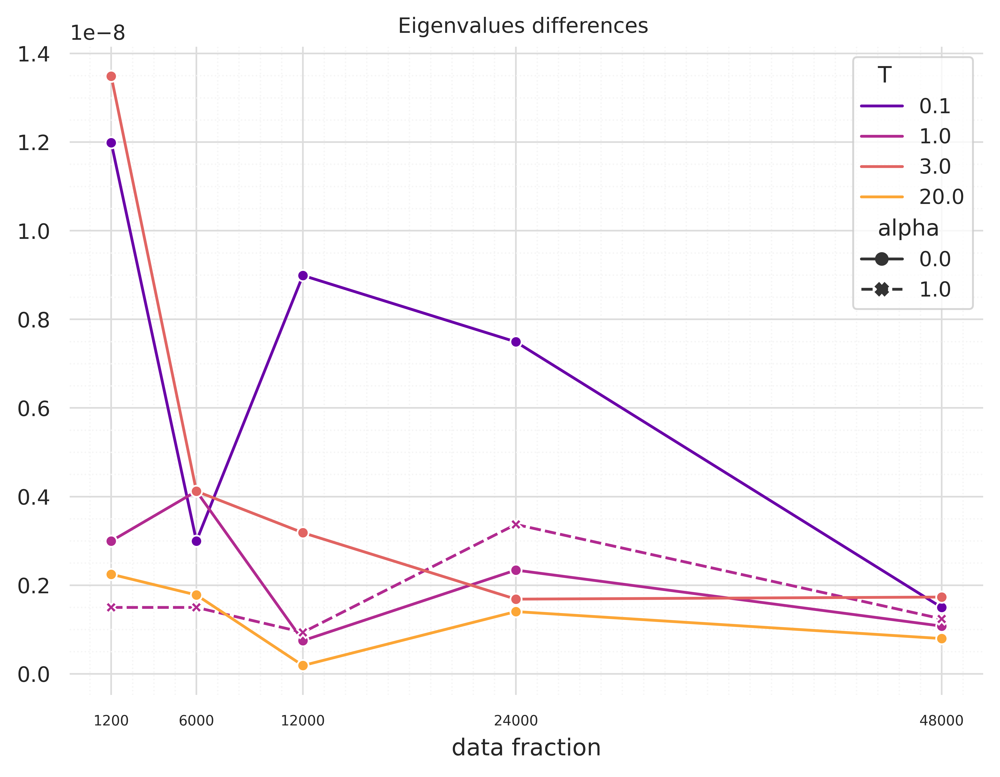

In [219]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(7,5), sharey=True, dpi=800)

    Range = 10
    K=3

    cmap = plt.get_cmap('Blues_r', Range)
    color_list = [mpl.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    line_styles = ['dotted','dashed','dashdot','solid']

    #_df = working_df.loc[working_df['temperature']==20]
    #_df = _df.loc[_df['data']>1200]
    g = sns.lineplot(data=working_df, x="data", y=f"e_{K}_u", errorbar="sd",
                    markers=True, marker='o', hue='T', style='alpha', palette='plasma',
                    ax=ax)

    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(data_sizes)
    #ax.set_xticklabels(['']+[ f'{l}' for l in buffer_sizes_p[0:]], fontsize=6)
    ax.set_xticklabels(data_sizes, fontsize=6)
    ax.tick_params(axis='x',  rotation=0)

    #yticks = [10.0, 25., 50., 70, teacher_val_accuracy, 90., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels(yticks, fontsize=6)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'data fraction', fontsize=10, y=+1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    

    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #plt.legend([],[], frameon=False)

    ax.set_title("Eigenvalues differences ", fontsize=9)

## Reading and plotting results

### Cifar10

In [ ]:
logs_path = './logs/results/cifar5m/CNN/logs_ntk.txt'
results = []
with open(logs_path) as f:
    while line := f.readline():
        results.append(json.loads(line))
res_df = pd.DataFrame(results)
res_df

,distributed,lr,checkpoints,checkpoints_stud,pretrained,optim_wd,optim_adam,optim_mom,optim_warmup,optim_nesterov,...,final_cka_val,final_ntk_train,final_ntk_val,buffer_train_time,final_train_acc_S,final_val_acc_S,final_train_agreement,final_val_agreement,final_val_function_distance,final_distance_teacher_student
0,no,0.1,True,False,False,0.001,False,0,5,False,...,0.684054,0.675447,0.123165,83.461511,80.416667,59.66,84.833333,61.57,0.446930,19.733492
1,no,0.1,True,False,False,0.001,False,0,5,False,...,0.713294,0.749401,0.135537,92.782521,76.083333,61.74,78.250000,63.70,0.361276,20.984230
2,no,0.1,True,False,False,0.001,False,0,5,False,...,0.720989,0.726614,0.121121,83.964860,67.916667,57.40,68.333333,58.81,0.407387,20.435444
3,no,0.1,True,False,False,0.001,False,0,5,False,...,0.648273,0.130834,0.127001,98.170681,79.750000,58.40,85.250000,59.91,0.464245,19.862463
4,no,0.1,True,False,False,0.001,False,0,5,False,...,0.387454,0.189914,0.183754,94.219054,75.083333,40.20,84.916667,41.05,0.710490,19.546009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,no,0.1,True,False,False,0.001,False,0,5,False,...,0.992984,0.912028,0.987609,1269.277373,85.926167,85.72,96.839500,97.54,0.028021,20.335043
419,no,0.1,True,False,False,0.001,False,0,5,False,...,0.993188,0.909919,0.986204,1225.979201,85.882000,85.93,96.745333,97.38,0.027936,20.291933
420,no,0.1,True,False,False,0.001,False,0,5,False,...,0.991791,0.908044,0.981554,1263.282393,85.828333,85.87,96.370000,96.77,0.033152,20.194229
421,no,0.1,True,False,False,0.001,False,0,5,False,...,0.992041,0.910577,0.985664,1248.491039,85.860500,85.89,96.490333,96.94,0.031109,20.135700


In [ ]:
res_df.columns

Index(['distributed', 'lr', 'checkpoints', 'checkpoints_stud', 'pretrained',
       'optim_wd', 'optim_adam', 'optim_mom', 'optim_warmup', 'optim_nesterov',
       'optim_cosineanneal', 'n_epochs', 'n_epochs_stud', 'batch_size',
       'validate_subset', 'temperature', 'temper_labels',
       'asymmetric_temperature', 'gpus_id', 'seed', 'notes', 'non_verbose',
       'disable_log', 'validation', 'ignore_other_metrics', 'debug_mode',
       'test_mode', 'nowand', 'wandb_entity', 'wandb_project', 'wandb_name',
       'buffer_size', 'minibatch_size', 'alpha', 'MSE', 'distillation_type',
       'K', 'C', 'gamma', 'final_val_acc_D', 'teacher_network',
       'student_network', 'final_cka_train', 'final_cka_val',
       'final_ntk_train', 'final_ntk_val', 'buffer_train_time',
       'final_train_acc_S', 'final_val_acc_S', 'final_train_agreement',
       'final_val_agreement', 'final_val_function_distance',
       'final_distance_teacher_student'],
      dtype='object')

In [ ]:
res_df['teacher_network'].unique(), res_df['student_network'].unique()

(array(['CNN'], dtype=object), array(['CNN'], dtype=object))

In [ ]:
working_df = res_df
working_df['T']= working_df['temperature'].astype('category')
working_df['data_size']= working_df['buffer_size'].astype('category')
working_df['buffer_size_p'] = working_df['buffer_size']/60000


In [ ]:
working_df['buffer_size'].unique()

array([  1200,   6000,  12000,  24000,  48000,  60000, 120000, 600000])

In [ ]:
temperatures = sorted(list(working_df['temperature'].unique()))
temperatures

[0.1, 1.0, 3.0, 5.0, 10.0, 20.0, 100.0, 1000.0]

In [ ]:
buffer_sizes_p = sorted(list(working_df['buffer_size_p'].unique()))
buffer_sizes_p

[0.02, 0.1, 0.2, 0.4, 0.8, 1.0, 2.0, 10.0]

In [ ]:
working_df['valiidation_error'] = 1- working_df['final_val_acc_S']/100

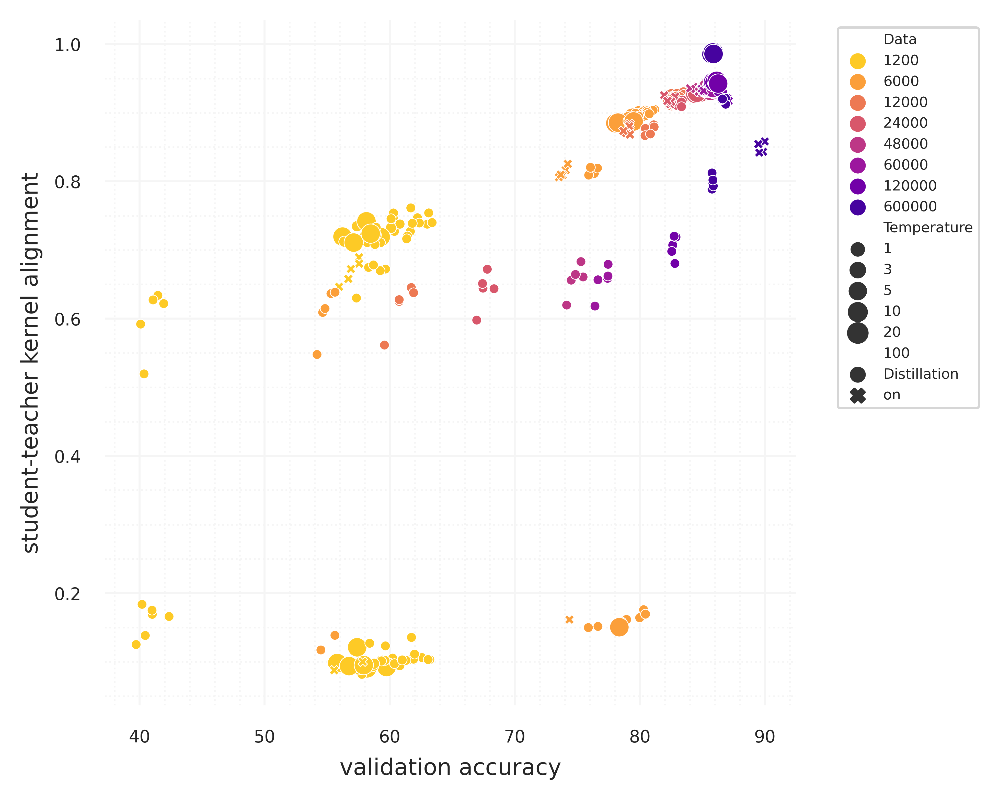

In [ ]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray', 'purple', 'mediumorchid','blueviolet','mediumpurple', 'slateblue','darkmagenta','magenta','cyan']
    buffer_size=12000

    #_df = pd.concat([df_fkd,df_cka, df],ignore_index=True)
    _df = working_df#.loc[working_df['buffer_size']==buffer_size]
    #_df = _df.loc[_df['T']!=0.1]



    sns.scatterplot(data=_df, x="final_val_acc_S", y="final_ntk_val",  s=10, size="temperature",
                marker='o',  style='alpha', hue='data_size', ax=ax, palette="plasma_r")
    
    # _df0 = _df.loc[_df['alpha']==0.0]
    # sns.lineplot(data=_df0, x="final_val_acc_S", y="final_cka_val", label="", ls=":",
    #             marker=None, hue="data_size",ax=ax, palette="plasma_r", err_style='bars')
    

    #ax.axvline(100.0, ls='--', color='tab:green')
    #ax.axhline(teacher_val_accuracy_rec, ls=':', color="tab:gray")
    # ax.axhline(teacher_train_accuracy, ls='-', color=colors[2], label="b")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    #ax.set_yscale('log')
    #ax.set_xscale('log')
    #ax.set_xlim([0.1,20.])
    #ax.set_xlim([0,80])

    ax.tick_params(axis='both',  labelsize=6)
    # xticks  = [.8, .9, 1.0]
    # ax.set_xticks(xticks)
    # ax.set_xticklabels(xticks, fontsize=6)
    # ax.tick_params(axis='x',  rotation=0)

    # yticks  = [.6, .7, .8, .9, 1.]
    # ax.set_yticks(yticks)
    # ax.set_yticklabels(yticks, fontsize=6)
    # ax.tick_params(axis='x',  rotation=0)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    #ax.set_title(f"Student-teacher Kernel alignment VS Validation accuracyon 48K samples", fontsize=11, y=1.05)
    ax.set_ylabel(r'student-teacher kernel alignment', fontsize=8, x=-0.2)
    ax.set_xlabel(r'validation accuracy', fontsize=8, y=+1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend(h, ["Data", 1200, 6000, 12000, 24000, 48000, 60000, 120000, 600000, "Temperature", 1, 3, 5, 10, 20, 100, "Distillation", "on", "off"], 
                title="", ncol=1, 
                bbox_to_anchor=(1.05, 1.0), fontsize=5)
    #ax.legend(bbox_to_anchor=(1.05, 1.0), fontsize=5)


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='whitesmoke', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('tab:olive')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()

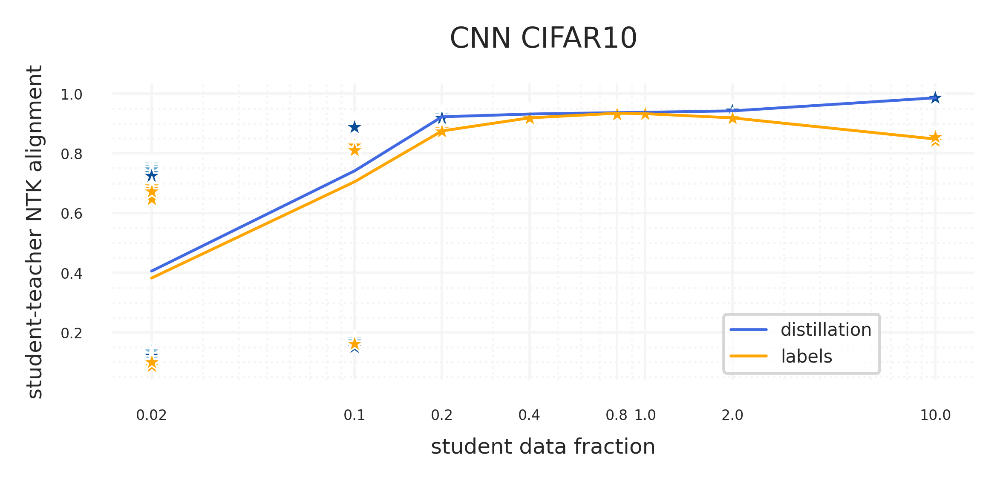

In [ ]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(4,2), sharey=True, dpi=600)
    colors = ['royalblue','orange','dimgray', 'purple', 'mediumorchid','blueviolet','mediumpurple', 'slateblue','darkmagenta','magenta','cyan']

    # sns.scatterplot(data=_df, x="buffer_size", y="final_cka_val", s=20, 
    #             marker='.', size='temperature', hue='alpha', ax=ax, palette="plasma_r")
    # sns.lmplot(data=_df, x="buffer_size", y="final_cka_val", hue='alpha', palette="plasma_r", logx=True)
    _df = working_df

    _df0 = _df.loc[_df['alpha']==0]#.loc[_df['asymmetric_temperature'].isna()]
    _df0A = _df0.loc[_df0['temperature']>1]
    _df0B = _df0.loc[_df0['temperature']<=1]
    # sns.scatterplot(data=_df0B, x="buffer_size", y="final_cka_train", s=10, 
    #             marker='.', style='asymmetric_temperature', color=colors[5], ax=ax)
    sns.lineplot(data=_df0A, x="buffer_size_p", y="final_ntk_val", linewidth=0.8, 
                 markersize=0, errorbar=None, err_style='bars',
                color=colors[0], ax=ax, label="drm")    
    sns.scatterplot(data=_df0A, x="buffer_size_p", y="final_ntk_val", s=30, palette="Blues",
                marker='*', hue="T", ax=ax, label=None)
    # sns.regplot(data=_df0, x="buffer_size", y="final_cka_val", ax=ax, color=colors[0], 
    #             scatter=False, line_kws={'linewidth':1}, logx=True, x_jitter=.55,
    #              ci=None)
    _df1 = _df.loc[_df['alpha']==1]
    sns.lineplot(data=_df1, x="buffer_size_p", y="final_ntk_val", linewidth=0.8,
                 markersize=0,errorbar=None,err_style='bars', 
                color=colors[1], ax=ax, label="erm")
    sns.scatterplot(data=_df1, x="buffer_size_p", y="final_ntk_val", s=30,
                marker='*', color=colors[1], ax=ax, label=None)
    # sns.regplot(data=_df1, x="buffer_size", y="final_cka_val", ax=ax, color=colors[1], line_kws={'linewidth':1},
    #               ci=None, scatter=False, logx=True, x_jitter=.55)

    #ax.axvline(100.0, ls='--', color='tab:green')
    #ax.axhline(teacher_val_accuracy_rec, ls=':', color="tab:gray")
    # ax.axhline(teacher_train_accuracy, ls='-', color=colors[2], label="b")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_xscale('log')
    #ax.set_yscale('log')
    #ax.set_xscale('symlog',linthresh=10e-2)
    #ax.set_xlim([0.1,20.])
    #ax.set_xlim([50,100])
    #ax.set_ylim([0.4,1.0])

    ax.tick_params(axis='both',  labelsize=4)
    #xticks  = [50., 60.0, 70., 80., 90., 100.0]
    xticks = buffer_sizes_p
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks, fontsize=4)
    #ax.tick_params(axis='x',  rotation=90)

    #yticks = [0.0, 25.0, 50.0, 75., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels([0.0, 25.0, 50.0, f'{teacher_val_accuracy}', 100.0], fontsize=8)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"CNN CIFAR10", fontsize=8, y=1.05)
    ax.set_ylabel(r'student-teacher NTK alignment', fontsize=6, x=-0.2)
    ax.set_xlabel(r'student data fraction', fontsize=6, y=-1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend([h[0],h[9]], [r'distillation','labels'], 
                title="", ncol=1, fontsize=5,
                bbox_to_anchor=(0.9, 0.25))
    #ax.legend(h, [], bbox_to_anchor=(1.05, 1.0), fontsize=5)
    


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='whitesmoke', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('tab:olive')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()

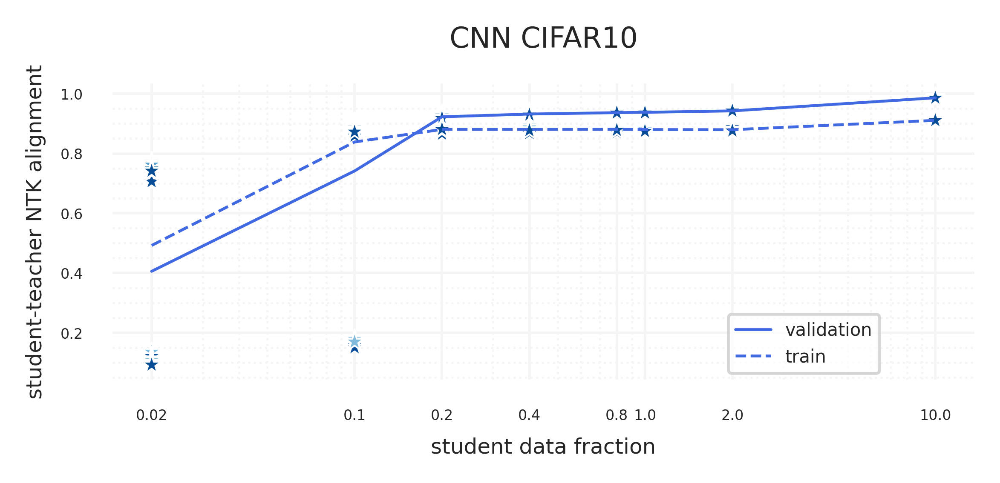

In [ ]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(4,2), sharey=True, dpi=600)
    colors = ['royalblue','orange','dimgray', 'purple', 'mediumorchid','blueviolet','mediumpurple', 'slateblue','darkmagenta','magenta','cyan']

    # sns.scatterplot(data=_df, x="buffer_size", y="final_cka_val", s=20, 
    #             marker='.', size='temperature', hue='alpha', ax=ax, palette="plasma_r")
    # sns.lmplot(data=_df, x="buffer_size", y="final_cka_val", hue='alpha', palette="plasma_r", logx=True)
    _df = working_df

    _df0 = _df.loc[_df['alpha']==0]#.loc[_df['asymmetric_temperature'].isna()]
    _df0A = _df0.loc[_df0['temperature']>1]
    _df0B = _df0.loc[_df0['temperature']<=1]
    # sns.scatterplot(data=_df0B, x="buffer_size", y="final_cka_train", s=10, 
    #             marker='.', style='asymmetric_temperature', color=colors[5], ax=ax)
    sns.lineplot(data=_df0A, x="buffer_size_p", y="final_ntk_val", linewidth=0.8, 
                 markersize=0, errorbar=None, err_style='bars',
                color=colors[0], ax=ax, label="drm")    
    sns.scatterplot(data=_df0A, x="buffer_size_p", y="final_ntk_val", s=30, palette="Blues",
                marker='*', hue="T", ax=ax, label=None)
    # sns.regplot(data=_df0, x="buffer_size", y="final_cka_val", ax=ax, color=colors[0], 
    #             scatter=False, line_kws={'linewidth':1}, logx=True, x_jitter=.55,
    #              ci=None)
    sns.lineplot(data=_df0A, x="buffer_size_p", y="final_ntk_train", linewidth=0.8, 
                 markersize=0, errorbar=None, err_style='bars', ls="--",
                color=colors[0], ax=ax, label="drm")    
    sns.scatterplot(data=_df0A, x="buffer_size_p", y="final_ntk_train", s=30, palette="Blues",
                marker='*', hue="T", ax=ax, label=None)
    # sns.regplot(data=_df1, x="buffer_size", y="final_cka_val", ax=ax, color=colors[1], line_kws={'linewidth':1},
    #               ci=None, scatter=False, logx=True, x_jitter=.55)

    #ax.axvline(100.0, ls='--', color='tab:green')
    #ax.axhline(teacher_val_accuracy_rec, ls=':', color="tab:gray")
    # ax.axhline(teacher_train_accuracy, ls='-', color=colors[2], label="b")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_xscale('log')
    #ax.set_yscale('log')
    #ax.set_xscale('symlog',linthresh=10e-2)
    #ax.set_xlim([0.1,20.])
    #ax.set_xlim([50,100])
    #ax.set_ylim([0.4,1.0])

    ax.tick_params(axis='both',  labelsize=4)
    #xticks  = [50., 60.0, 70., 80., 90., 100.0]
    xticks = buffer_sizes_p
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks, fontsize=4)
    #ax.tick_params(axis='x',  rotation=90)

    #yticks = [0.0, 25.0, 50.0, 75., 100.0]
    #plt.yticks(yticks)
    #ax.set_yticklabels([0.0, 25.0, 50.0, f'{teacher_val_accuracy}', 100.0], fontsize=8)

    #ax.axvline(x=1.0, color='mediumslateblue', linewidth=1.0, linestyle=':')

    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    # ax.set_ylim(-1,10000.0)


    ax.set_title(f"CNN CIFAR10", fontsize=8, y=1.05)
    ax.set_ylabel(r'student-teacher NTK alignment', fontsize=6, x=-0.2)
    ax.set_xlabel(r'student data fraction', fontsize=6, y=-1)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend([h[0],h[9]], [r'validation','train'], 
                title="", ncol=1, fontsize=5,
                bbox_to_anchor=(0.9, 0.25))
    #ax.legend(h, [], bbox_to_anchor=(1.05, 1.0), fontsize=5)
    


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='whitesmoke', linewidth=0.7)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('tab:olive')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()